# RNA velocity of Zebrafish development (NMPs) 
**Dataset**: single-cell RNA seq for multiple timepoints of zebrafish development <br>
**Goals**: Create a unified atlas that represent the evolution of progenitors as they differentiate into cell types <br> <br>

**Data location (h5ad for individual time-points)**: '/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/rna_vel_timpoints' 

In [1]:
import scvelo as scv
import numpy as np
import os
import scanpy as sc

scv.settings.set_figure_params('scvelo')  # for beautified visualization


In [97]:
import os

os.getpid()

82624

## Overview
* Read the master velocity file 
* Read NMPs subset and do velocity 
* Read individual umaps and do velocity 


IF we assume all objects from seurat have the same format, we can define a function that read h5ad, maps to the master object, merges metdata and takes the Seurat umap. Then it runs velocity 

# RNA velocity for the NMP lineages

## Read the NMP object and match with RNA velocity counts 


In [2]:
VELO_DIR = '/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/velocity_objects/' # velocity object with all cells 
NMP_DIR =  '/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/' # sct nmp subsets 
LOOM_DIR = '/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/loom_velocity/' # save loom files for sc.velo here 

Master velocity object 

In [3]:
# Note Feb 2022: latest version with global annotation. Output of NB3
velocyto_adata = sc.read_loom(VELO_DIR + "velocyto_38k_cells.loom")

In [4]:
velocyto_adata.obs.set_index('cell_id', inplace = True, drop = False )

In [5]:
velocyto_adata.var = velocyto_adata.var.astype(str)
velocyto_adata.var.set_index('gene_name', inplace = True, drop = False)

velocyto_adata.var_names_make_unique() 

In [6]:
np.sum(velocyto_adata[:,['tbxta']].layers['matrix'].toarray() ) , np.sum(velocyto_adata[:,['tbxta']].layers['spliced'].toarray() ) ,np.sum(velocyto_adata[:,['tbxta']].layers['unspliced'].toarray() ) 

(35523.0, 35523.0, 858.0)

In [7]:
velocyto_adata.layers['counts'] = velocyto_adata.X.copy() 

Reference dataset, we only want the UMAP and annotations from here

In [8]:
nmp_all = 'danio_nmps_seurat.h5ad' # UMAP from Seurat notebook 4
nmp_adata = sc.read_h5ad(NMP_DIR + nmp_all)

In [9]:
nmp_adata.obs.head() 

,orig.ident,nCount_RNA,nFeature_RNA,cell_id,n_genes,n_counts,X10X_run,fish,fish_n,timepoint,...,total_counts,total_counts_mt,pct_counts_mt,total_counts_nc,pct_counts_nc,cell_annotation,global_annotation,integrated_snn_res.0.5,seurat_clusters,integrated_snn_res.1
TDR18_AAACCCAAGGCGAAGG-1,TDR18,42042.0,5408,TDR18_AAACCCAAGGCGAAGG-1,5408,42042.0,TDR18,TDR18,18,10somite,...,42042.0,480.0,1.141715,348.0,0.827744,hindbrain_sox19a.mdkb.mex3b,Neural_Posterior,6,12,12
TDR18_AAAGGGCAGATGACAT-1,TDR18,21909.0,4491,TDR18_AAAGGGCAGATGACAT-1,4491,21909.0,TDR18,TDR18,18,10somite,...,21909.0,487.0,2.222831,602.0,2.747729,PSM_msgn1,PSM,7,1,1
TDR18_AAAGGGCAGGCCCAAA-1,TDR18,43288.0,4966,TDR18_AAAGGGCAGGCCCAAA-1,4966,43288.0,TDR18,TDR18,18,10somite,...,43288.0,511.0,1.180466,381.0,0.880151,Somites_meox1,Somites,7,11,11
TDR18_AAAGGTAAGATACGAT-1,TDR18,43099.0,4976,TDR18_AAAGGTAAGATACGAT-1,4976,43099.0,TDR18,TDR18,18,10somite,...,43099.0,434.0,1.006984,570.0,1.322537,PSM_msgn1,PSM,7,1,1
TDR18_AAAGGTACAGTATTCG-1,TDR18,32071.0,4479,TDR18_AAAGGTACAGTATTCG-1,4479,32071.0,TDR18,TDR18,18,10somite,...,32071.0,315.0,0.982196,199.0,0.620498,PSM_msgn1,PSM,7,11,11


Check the raw object for numbers of counts

In [10]:
adata2 = nmp_adata.raw.to_adata() 
adata2.var['_index'] = adata2.var['_index'].astype(str)
adata2.var.set_index("_index", inplace = True, drop= False)

In [11]:
np.sum(adata2[:,['tbxta']].X.toarray() )

31060.0

In [12]:
adata2[:,['tbxta']].X.shape

(16452, 1)

Processing Functions 

In [13]:

def quick_sc_normalization(adata_obj): 
    sc.pp.filter_genes(adata_obj, min_cells=3)

    #adata_obj.layers['counts'] = adata_obj.X.copy() 

    sc.pp.normalize_total(adata_obj, target_sum=1e4)
    sc.pp.log1p(adata_obj)

    adata_obj.raw = adata_obj.copy() 

    sc.pp.highly_variable_genes(adata_obj, min_mean=0.0125, max_mean=3, min_disp=0.5)
    #sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
    sc.pp.scale(adata_obj, max_value=10)
    print('PCA....')
    sc.tl.pca(adata_obj, n_comps = 100, svd_solver='arpack')
    
    return adata_obj

def quick_sc_clustering(adata_obj, n_pcs= 50, k_neigh = 30 ):
    print('Neighbors....')
    sc.pp.neighbors(adata_obj, 
                   metric='cosine', 
                   n_neighbors= k_neigh  , n_pcs=n_pcs )
    print('UMAP....')
    sc.tl.umap(adata_obj, min_dist=0.3)
    #print('Leiden clusters....')
    #sc.tl.leiden(adata_obj)

    return adata_obj

# Dec 8th 2021 
# cell_id is the common column for merging 
# 

def mergeVelocity(velo_adata, subset_adata, run_vanilla = False, npc = 50, k = 30  ):
    # Merge velocity counts with a reference adata object 
    # subset adata it's only used for the cell_ids and the umap, we are not using the counts at all 
        
    # 1. subset according to the reference object 
    velo_subset  = velo_adata[velo_adata.obs.cell_id.isin(subset_adata.obs.cell_id)].copy() 
    # 2. sort in the same order 
    velo_subset = velo_subset[subset_adata.obs_names].copy() 
    
    # 3.optional -- if the object has not been normalized, clustered, etc we can run this step 
    if(run_vanilla): 
        velo_subset = quick_sc_normalization(velo_subset.copy() )
        velo_subset = quick_sc_clustering(velo_subset.copy() , npc, k )
    
    # 4. replace UMAP with reference version 
    # 
    velo_subset.obsm['X_umap'] =subset_adata.obsm['X_umap']
    velo_subset.obs['clusters'] = subset_adata.obs['seurat_clusters']
    
    return velo_subset 

In [14]:
adata = mergeVelocity(velocyto_adata , nmp_adata, run_vanilla = True)

PCA....
Neighbors....
UMAP....


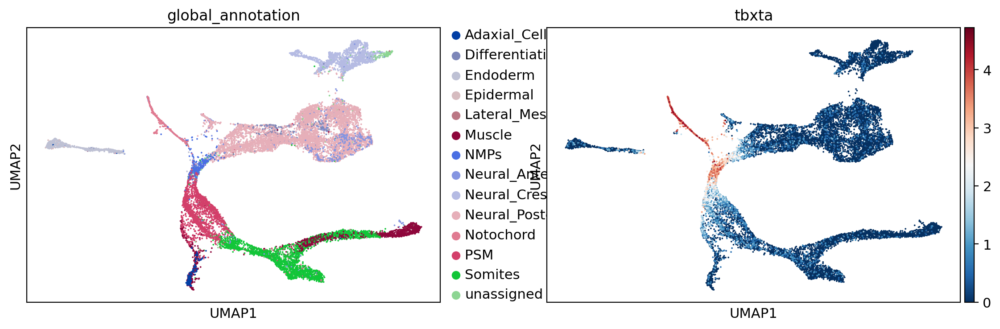

In [590]:
sc.pl.umap(adata, color = ["global_annotation","tbxta"], use_raw = False)

Convert to loom file

In [57]:
adata.write_loom(LOOM_DIR + 'nmps_all.loom',write_obsm_varm=True)

In [16]:
adata.obs.head() 

,10X_run,barcode,batch,cell_annotation,cell_id,cell_id2,global_annotation,timepoint,clusters
cell_id,,,,,,,,,
TDR18_AAACCCAAGGCGAAGG-1,TDR18,AAACCCAAGGCGAAGG,1,hindbrain_sox19a.mdkb.mex3b,TDR18_AAACCCAAGGCGAAGG-1,TDR18_AAACCCAAGGCGAAGG-1,Neural_Posterior,10somite,12
TDR18_AAAGGGCAGATGACAT-1,TDR18,AAAGGGCAGATGACAT,1,PSM_msgn1,TDR18_AAAGGGCAGATGACAT-1,TDR18_AAAGGGCAGATGACAT-1,PSM,10somite,1
TDR18_AAAGGGCAGGCCCAAA-1,TDR18,AAAGGGCAGGCCCAAA,1,Somites_meox1,TDR18_AAAGGGCAGGCCCAAA-1,TDR18_AAAGGGCAGGCCCAAA-1,Somites,10somite,11
TDR18_AAAGGTAAGATACGAT-1,TDR18,AAAGGTAAGATACGAT,1,PSM_msgn1,TDR18_AAAGGTAAGATACGAT-1,TDR18_AAAGGTAAGATACGAT-1,PSM,10somite,1
TDR18_AAAGGTACAGTATTCG-1,TDR18,AAAGGTACAGTATTCG,1,PSM_msgn1,TDR18_AAAGGTACAGTATTCG-1,TDR18_AAAGGTACAGTATTCG-1,PSM,10somite,11


## Calculate velocity for nmp subset 

In [17]:
def velo_analysis(adata_obj, clus_label = 'clusters'):
    scv.utils.show_proportions(adata_obj)

    adata_obj.X = adata_obj.layers['counts'].copy()  # sc.velo uses unnormalized counts

    scv.pp.filter_and_normalize(adata_obj, min_shared_counts=20, n_top_genes=3000)
    scv.pp.moments(adata_obj, n_pcs=50, n_neighbors=30)

    scv.tl.velocity(adata_obj, mode='stochastic')


    scv.tl.velocity_graph(adata_obj)
    # Add cluster label 
    if(clus_label != 'clusters'):
        adata_obj.obs['clusters'] = adata_obj.obs[clus_label]
        
    return adata_obj

In [174]:
LOOM_DIR

'/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/loom_velocity/'

In [175]:
adata = scv.read(LOOM_DIR + 'nmps_all.loom')
# loom file resets the indexes for some reason 
adata.var.set_index('gene_name', inplace =True, drop = False)

/data/alejandro/miniconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/alejandro/miniconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [176]:
# Main call for velocity 
adata = velo_analysis(adata_obj = adata.copy() )

Abundance of ['spliced', 'unspliced']: [0.86 0.14]
Filtered out 8244 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:03) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:12) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/112 cores)


  0%|          | 0/16452 [00:00<?, ?cells/s]

/data/alejandro/miniconda3/envs/cellrank/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:01:57) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [2]:
palette_celltype = {'Hindbrain':'darkcyan',
                    'NeuralCrest': 'coral',
                    'PharyngealArc': 'slateblue',
                    'LateralPlate':'dimgrey',
                    'Muscle': 'mediumorchid',
                    'Endoderm':'darkred',
                    'FloorPlate': 'olive',
                    'Notochord':'rosybrown',
                    'NMPs':'goldenrod',
                    'Somites':'deepskyblue',
                    'NeuralTube':'darkseagreen',
                    'Myotome':'peachpuff',
                    'PSM':'lightsteelblue'}




saving figure to file ./figures/scvelo_UMAP_crop_velocity.svg


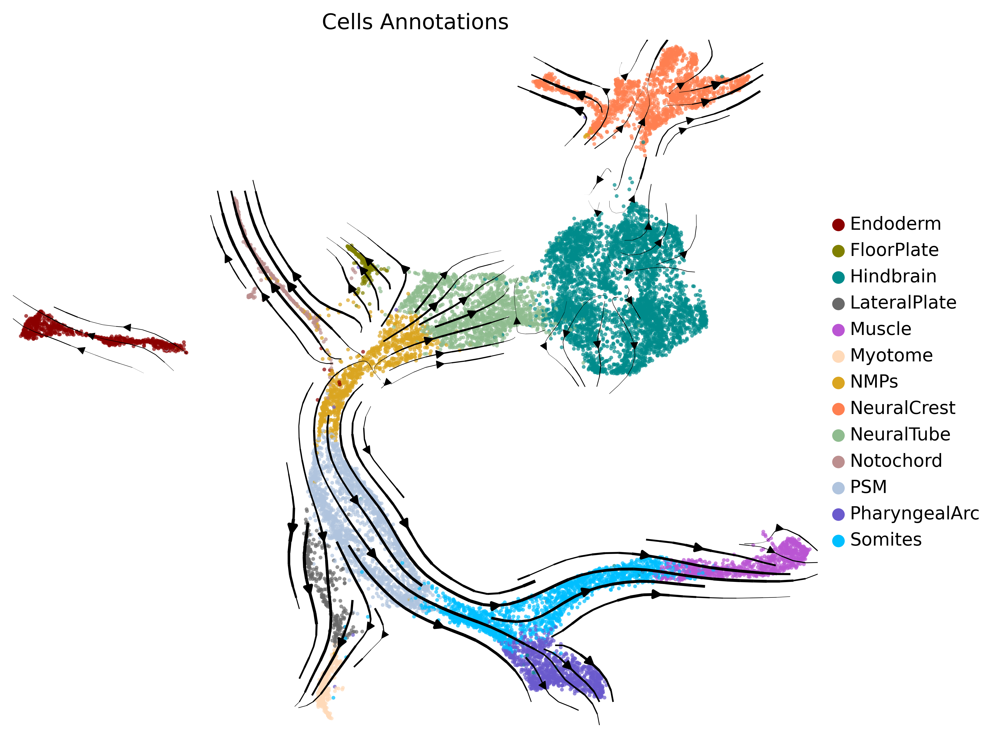

In [611]:
# Main plotting function from scvelo 
# This will only show the arrows on top of the provided UMAP 
# 
scv.pl.velocity_embedding_stream(adata, basis='umap', dpi =300,
                                 legend_fontsize =10, color = 'Cells_Annotations',
                                figsize = (8,7), size = 18, legend_loc = 'right margin' , palette = palette_celltype, 
                                save = 'UMAP_crop_velocity.svg', alpha = 0.7)

In [962]:
adata

AnnData object with n_obs × n_vars = 16452 × 3000
    obs: '10X_run', 'barcode', 'batch', 'cell_annotation', 'cell_id', 'cell_id2', 'clusters', 'global_annotation', 'timepoint', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'Cells_Annotations', 'fish'
    var: 'dispersions', 'dispersions_norm', 'gene_id', 'gene_name', 'highly_variable', 'mean', 'means', 'n_cells', 'std', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'global_annotation_colors', 'Cells_Annotations_colors'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'counts', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

In [613]:
pwd

'/data/alejandro/danio-atlas/data'

Export main UMAP with the same colors (no velocity) 

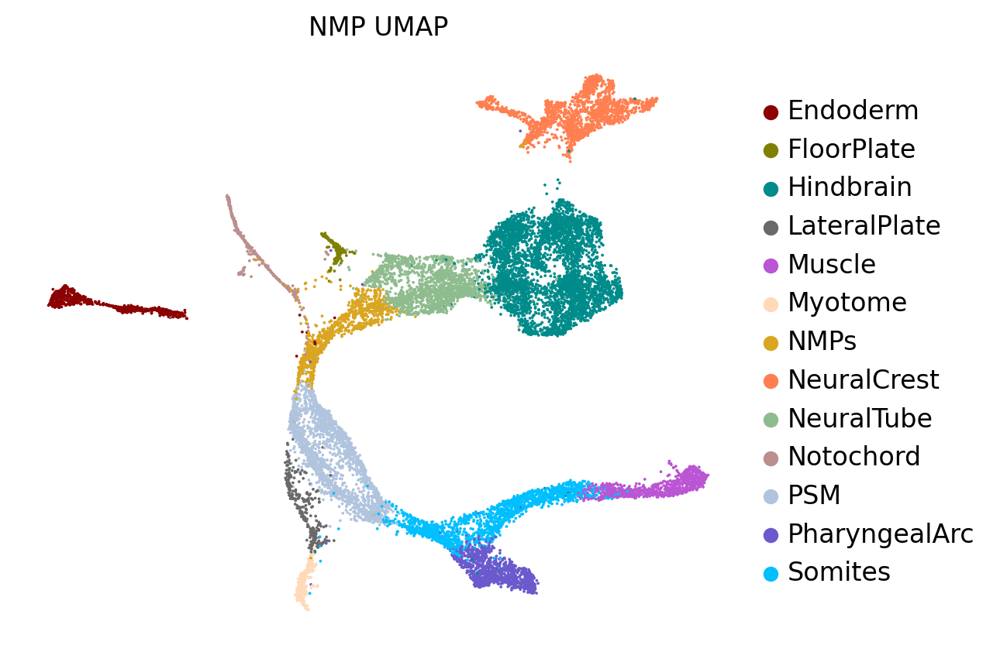

In [421]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6,5))

sc.pl.umap(adata, color='Cells_Annotations', add_outline=False, legend_loc='right margin',
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='NMP UMAP', 
               ax=ax, show = False)
    
plt.show() 

In [422]:
fig.savefig('figures/UMAP_cropNMP_cellannotation.png', dpi=400, bbox_inches='tight', transparent=True)


Save FINAL annotations (these will be used in the paper!) <br>
**IF annotations change, please update with a correponding data frame**

In [586]:
adata.obs.head() 

,10X_run,barcode,batch,cell_annotation,cell_id,cell_id2,clusters,global_annotation,timepoint,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition,Cells_Annotations,fish
0,TDR18,AAACCCAAGGCGAAGG,1,hindbrain_sox19a.mdkb.mex3b,TDR18_AAACCCAAGGCGAAGG-1,TDR18_AAACCCAAGGCGAAGG-1,12,Neural_Posterior,10somite,41100.0,9283.0,41100.0,30501.064453,0.282471,Hindbrain,TDR18
1,TDR18,AAAGGGCAGATGACAT,1,PSM_msgn1,TDR18_AAAGGGCAGATGACAT-1,TDR18_AAAGGGCAGATGACAT-1,1,PSM,10somite,21524.0,9238.0,21524.0,28776.351562,0.144779,PSM,TDR18
2,TDR18,AAAGGGCAGGCCCAAA,1,Somites_meox1,TDR18_AAAGGGCAGGCCCAAA-1,TDR18_AAAGGGCAGGCCCAAA-1,11,Somites,10somite,41799.0,5257.0,41799.0,30667.578125,0.110335,PSM,TDR18
3,TDR18,AAAGGTAAGATACGAT,1,PSM_msgn1,TDR18_AAAGGTAAGATACGAT-1,TDR18_AAAGGTAAGATACGAT-1,1,PSM,10somite,42415.0,7747.0,42415.0,29871.021484,0.176677,PSM,TDR18
4,TDR18,AAAGGTACAGTATTCG,1,PSM_msgn1,TDR18_AAAGGTACAGTATTCG-1,TDR18_AAAGGTACAGTATTCG-1,11,PSM,10somite,31686.0,5258.0,31686.0,30816.904297,0.119291,PSM,TDR18


In [587]:
adata.obs.to_csv('/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/metadata/May5_ML_annotations.csv',
                index = False , header = True)

Plot individual timepoints

### Annotations April 2022 -- Manuscript version 
New annotations based on the global object with 16k cells

In [183]:
adata_ann = sc.read_h5ad('/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/nmp_crop_annotated/nmp_crop_annotatedApril.h5ad')

adata_ann

In [201]:
len(set(adata_ann.obs.Cells_Annotations))

13

In [204]:
adata_ann.obs.Cells_Annotations = adata_ann.obs.Cells_Annotations.astype(str)
adata_ann.obs.New_NMPs = adata_ann.obs.New_NMPs.astype(str)

adata_ann.obs.loc[adata_ann.obs.New_NMPs!='unassigned','Cells_Annotations'] = 'NMPs'

... storing 'Cells_Annotations' as categorical
... storing 'New_NMPs' as categorical


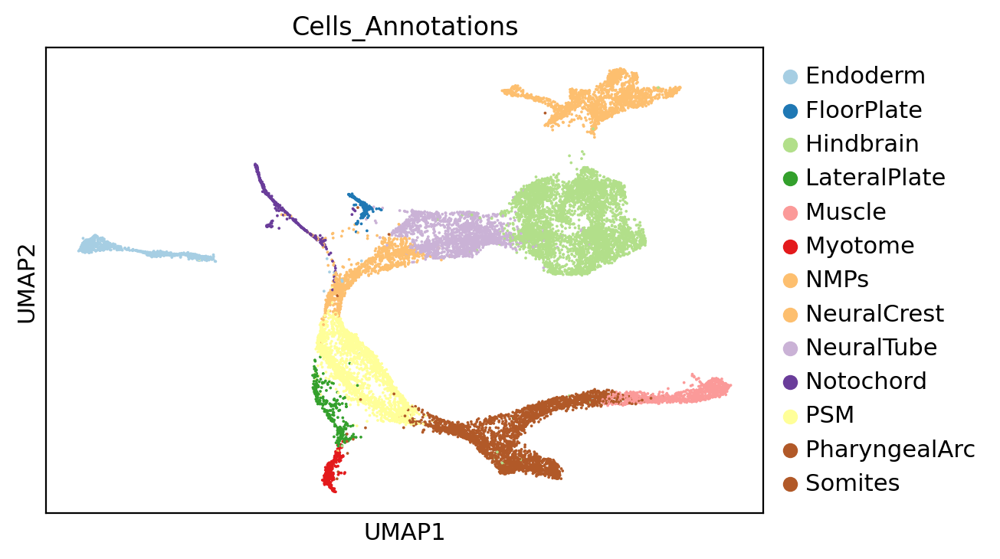

In [205]:
sc.pl.umap(adata_ann, color ='Cells_Annotations', palette = 'Paired')

In [211]:
adata.obs['Cells_Annotations'] = adata_ann.obs.Cells_Annotations.astype(str).values

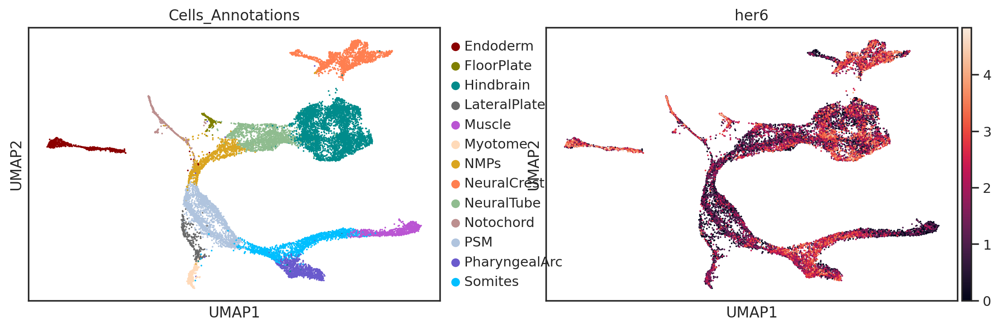

In [961]:
sc.pl.umap(adata, color = ['Cells_Annotations','her6'])

Manuscript version (Jul 2022) 

In [967]:
adata.write('/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/danio_nmps_manuscript.h5ad')

In [968]:
adata.obs.to_csv('/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/metadata/May5_ML_annotations.csv',
                index = False , header = True)

In [449]:
adata_velo = adata.copy() 

# RNA velocity per timepoint 

## Read individual timepoints as h5ad and covert to loom files
Last run April 14th, 2022  <br>
* Load each timepoint (from Seurat) 
* Merge with big velocyto object (using the function defined above) -- counts are raw
* Run velocity individually using the object 

In [101]:
NMP_DIR = '/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/timepoints/aligned_UMAP' # read Seurat UMAP objects from here 

data_path = NMP_DIR

data_folders = [f for f in os.listdir(data_path) if f.startswith('nmps_')]
display(data_folders)

In [102]:
for s in data_folders: 
    adata_aux = sc.read_h5ad(data_path + '/' + s)
    adata_aux_loom = mergeVelocity(velocyto_adata , adata_aux, run_vanilla = True) # merge umap with velocyto
    adata_aux_loom.write_loom(f"{data_path}/{s.split('.')[0] }.loom", write_obsm_varm=True) #same file name with .loom extension

PCA....
Neighbors....
UMAP....
PCA....
Neighbors....
UMAP....
PCA....
Neighbors....
UMAP....
PCA....
Neighbors....
UMAP....
PCA....
Neighbors....
UMAP....
PCA....
Neighbors....
UMAP....


In [106]:
loom_files = [d.split('.')[0] + '.loom' for d in data_folders]

In [112]:
loom_velo_files = list(set(loom_files))
loom_velo_files.sort() 

In [113]:
loom_velo_files

['nmps_05somite.loom',
 'nmps_0budstage.loom',
 'nmps_10somite.loom',
 'nmps_15somite.loom',
 'nmps_20somite.loom',
 'nmps_30somite.loom']

In [114]:
data_path

'/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/timepoints/aligned_UMAP'

## Run scvelo for each sample
April 14th, 2022 <br>

* Load h5ad files for each time point (one with velocity, one with umap and global annotations) 
* For loop, merge velo and cellranger objects 
* Run velocity on each 

In [115]:
# read loom files as scvelo objects
adata_list = list() 
for l in loom_velo_files:
    adata = scv.read(data_path + '/' + l)            # read loom file for this timepoint 
    adata = velo_analysis(adata_obj = adata.copy() ) # RNA velocity 
    adata_list.append(adata)                         # append analyzed object 

Abundance of ['spliced', 'unspliced']: [0.87 0.13]
Filtered out 9561 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/112 cores)


  0%|          | 0/3464 [00:00<?, ?cells/s]

    finished (0:00:18) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
Abundance of ['spliced', 'unspliced']: [0.84 0.16]
Filtered out 8955 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/112 cores)


  0%|          | 0/585 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
Abundance of ['spliced', 'unspliced']: [0.82 0.18]
Filtered out 8299 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/112 cores)


  0%|          | 0/1748 [00:00<?, ?cells/s]

    finished (0:00:08) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
Abundance of ['spliced', 'unspliced']: [0.87 0.13]
Filtered out 9420 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/112 cores)


  0%|          | 0/2815 [00:00<?, ?cells/s]

    finished (0:00:16) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
Abundance of ['spliced', 'unspliced']: [0.84 0.16]
Filtered out 8919 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/112 cores)


  0%|          | 0/2191 [00:00<?, ?cells/s]

    finished (0:00:11) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
Abundance of ['spliced', 'unspliced']: [0.87 0.13]
Filtered out 9393 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/112 cores)


  0%|          | 0/5248 [00:00<?, ?cells/s]

    finished (0:00:43) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


## Annotations from individual timepoints 
May 2nd <br>
After re-vieweing the individual timepoint UMAPs, Merlin re-annotated some cells. <br>
* Load individual UMAPS
* Copy the annotations 
* Re-plot


In [567]:
# Annotated objects: 
ML_ANN='/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/timepoints/aligned_UMAP/with_sox2_MLann/'

# New annotations are under 
var_name = 'Annotations_IndivTimePoint'
for idx, a in enumerate(adata_list):
    which_timepoint = adata_list[idx].obs['timepoint'][0]
    if(which_timepoint =='0 budstage'):
        which_timepoint = '0budstage'
#     if(which_timepoint =='30somite'):
#         var_name = 'Anntotions_IndivTimePoint'
    a_ann = sc.read_h5ad(ML_ANN + which_timepoint+ "_ML.h5ad")
    a_ann.obs[var_name] = a_ann.obs[var_name].astype(str)
    adata_list[idx].obs['Annotations_IndivTimePoint'] = a_ann.obs[var_name].values 
    

## Version 1: using the UMAP computed from the integrated latent space (Seurat CCA transform) 

In [578]:
# palette_celltype = {'Neural_Posterior':'darkcyan',
#                     'Neural_Crest': 'coral',
#                     'Somites': 'slateblue',
#                     'PSM':'darkviolet',
#                     'Muscle': 'mediumorchid',
#                     'Endoderm':'gray',
#                     'Neural_Anterior': 'darkturquoise',
#                     'Notochord':'rosybrown',
#                     'NMPs':'gold',
#                     'unassigned':'silver',
#                     'Differentiating_Neurons':'lightseagreen',
#                     'Epidermal':'linen',
#                     'Adaxial_Cells': 'lightgray',
#                     'Lateral_Mesoderm':'gray'}


palette_celltype = {'Hindbrain':'darkcyan',
                    'NeuralCrest': 'coral',
                    'PharyngealArc': 'slateblue',
                    'PharyngealArch': 'slateblue',
                    'LateralPlate':'dimgrey',
                    'Muscle': 'mediumorchid',
                    'Muscles': 'mediumorchid',
                    'Endoderm':'darkred',
                    'FloorPlate': 'olive',
                    'FloorPalte': 'olive',
                    'Notochord':'rosybrown',
                    'NMPs':'goldenrod',
                    'Somites':'deepskyblue',
                    'NeuralTube':'darkseagreen',
                    'Myotome':'peachpuff',
                    'PSM':'lightsteelblue'}

In [551]:
adata_list[3].obs['Cells_Annotations'].value_counts()

Hindbrain        483
Somites          418
NeuralCrest      404
PSM              343
NeuralTube       266
Endoderm         219
PharyngealArc    200
NMPs             129
Myotome          112
Notochord        111
LateralPlate      66
FloorPlate        54
Muscle            10
Name: Cells_Annotations, dtype: int64

In [552]:
adata_list[3].obs.timepoint[0]

'15somite'

saving figure to file ./figures/scvelo_05somite_UMAP_velocity_NOLABEL.png


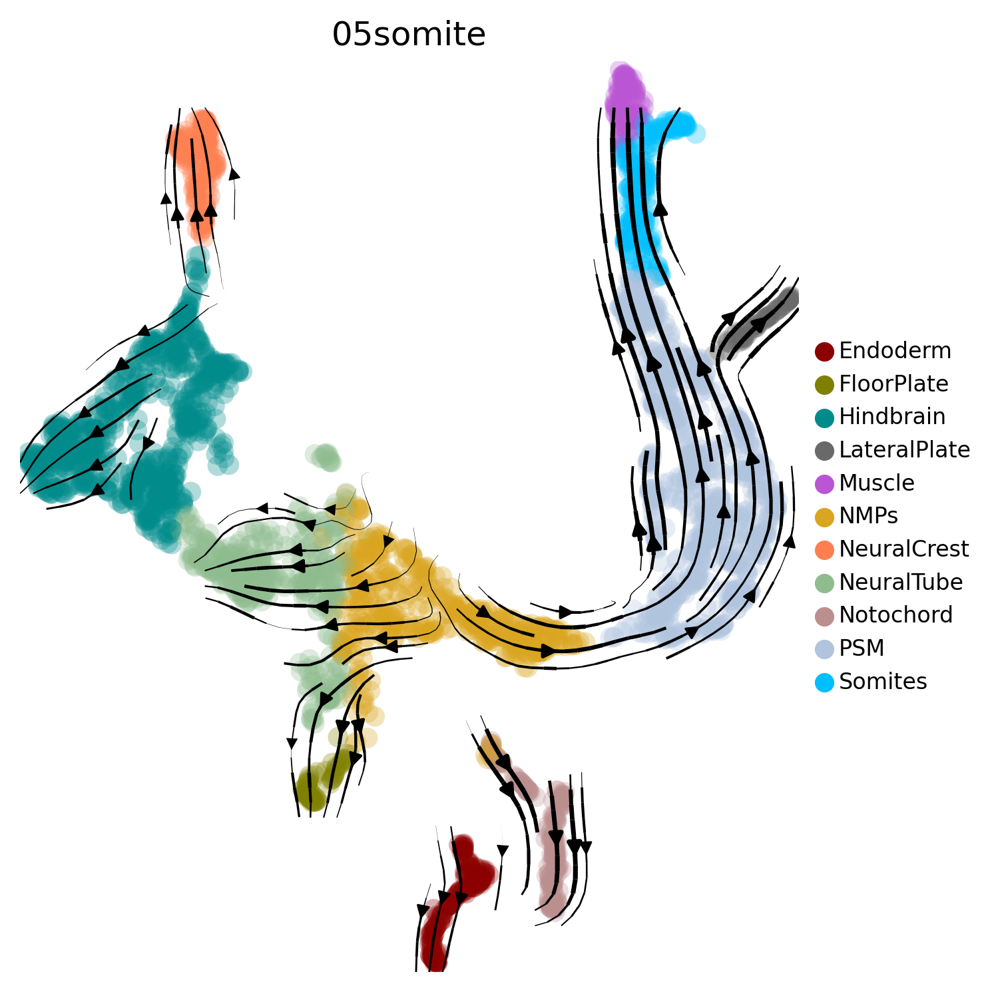

saving figure to file ./figures/scvelo_0 budstage_UMAP_velocity_NOLABEL.png


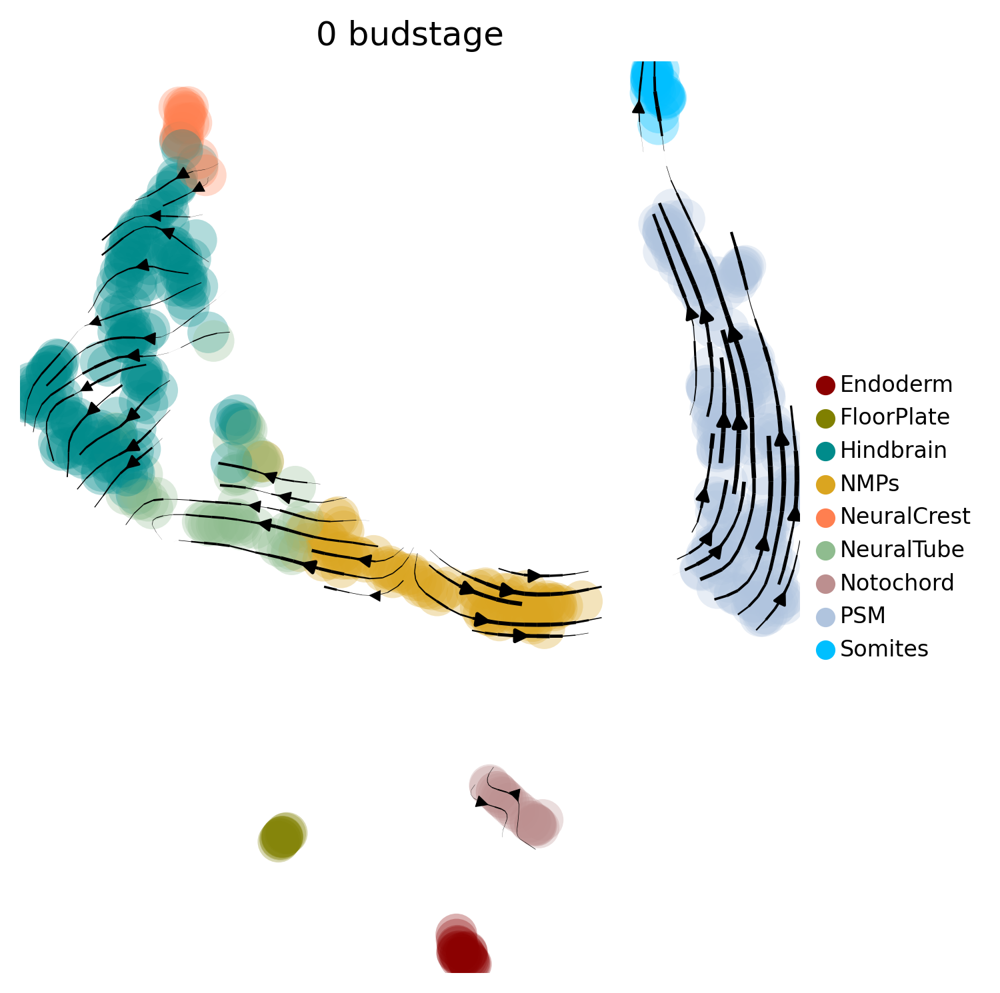

saving figure to file ./figures/scvelo_10somite_UMAP_velocity_NOLABEL.png


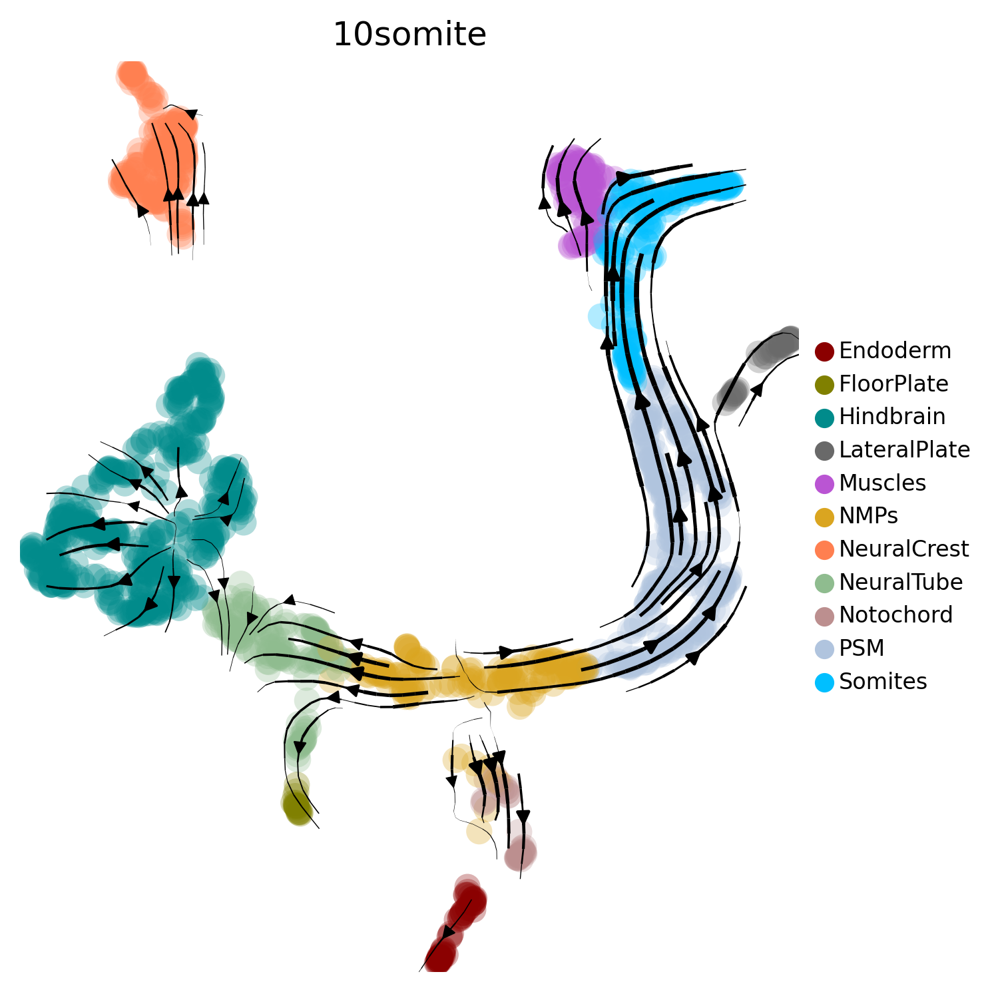

saving figure to file ./figures/scvelo_15somite_UMAP_velocity_NOLABEL.png


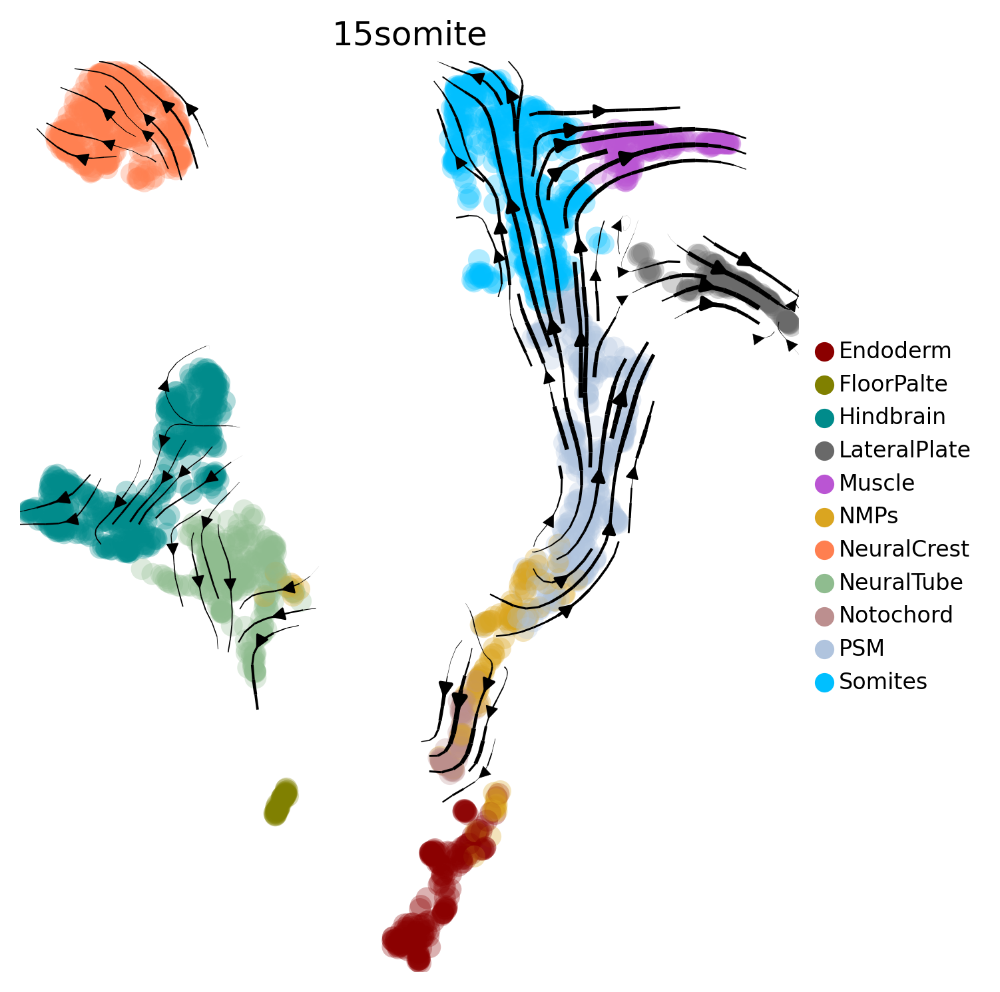

saving figure to file ./figures/scvelo_20somite_UMAP_velocity_NOLABEL.png


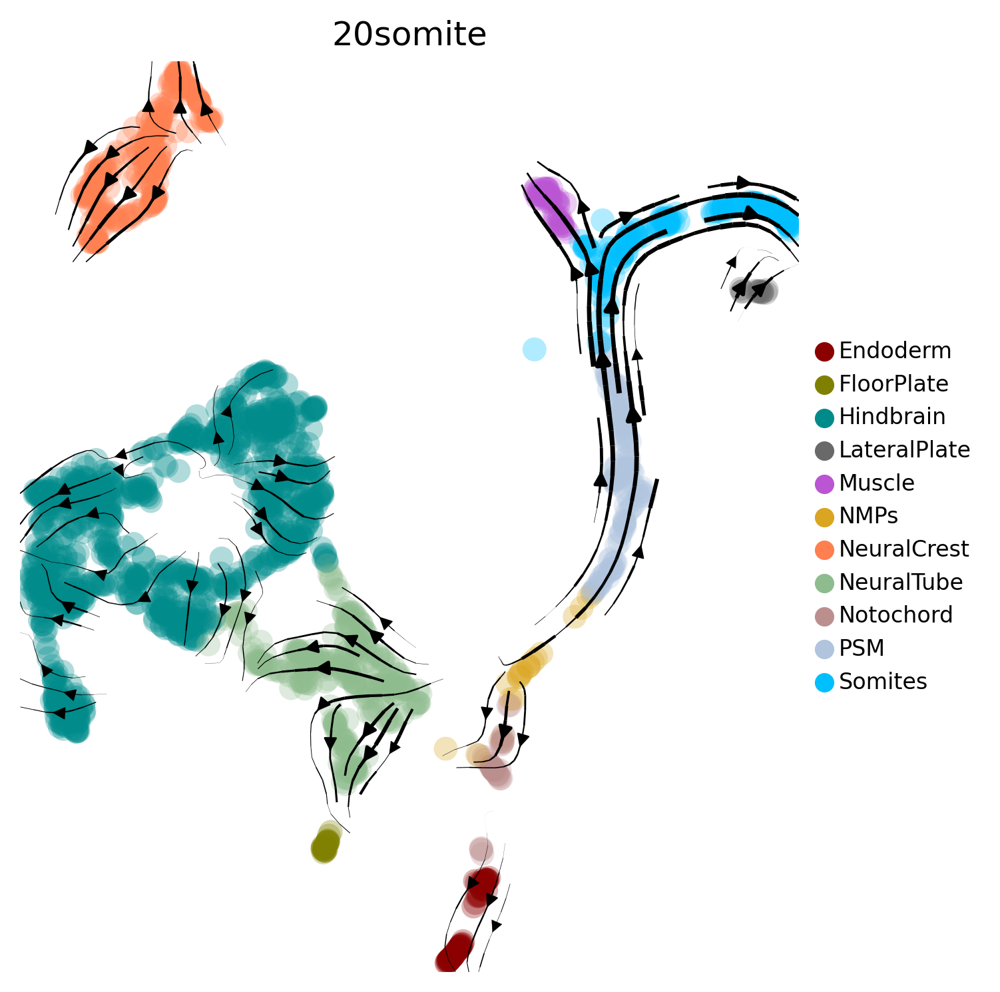

saving figure to file ./figures/scvelo_30somite_UMAP_velocity_NOLABEL.png


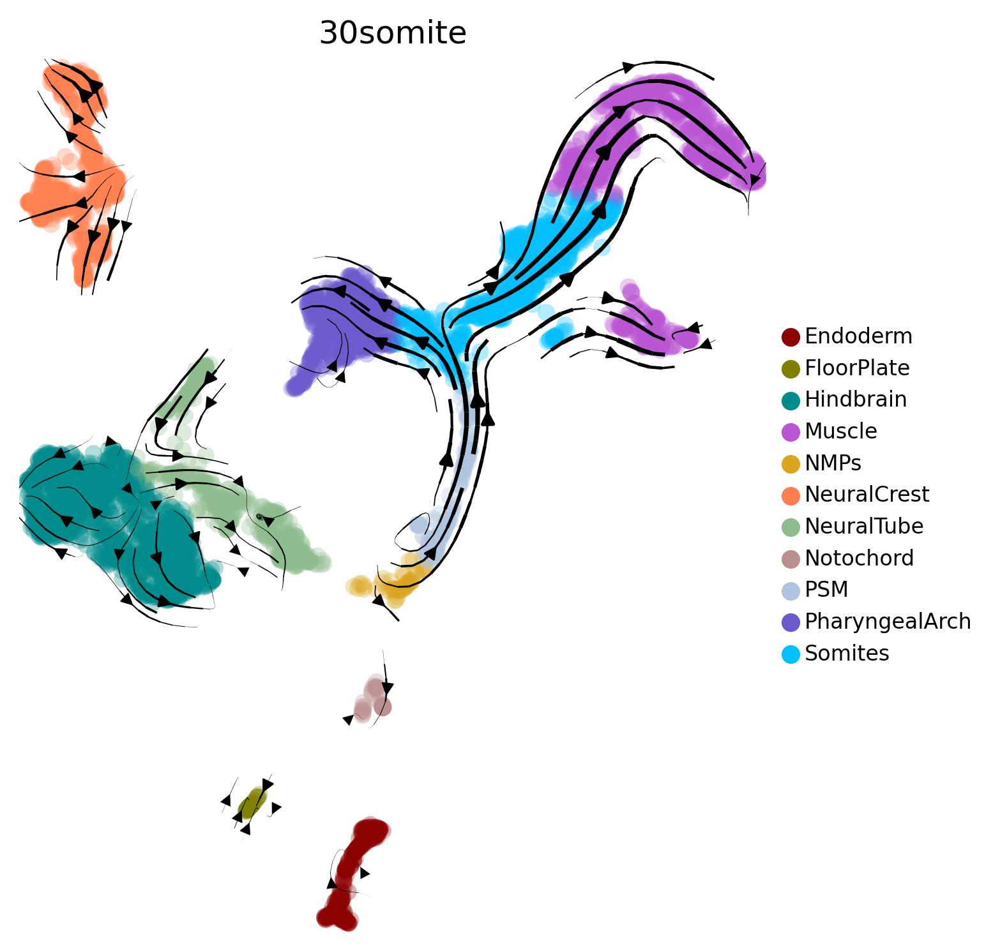

In [615]:
for idx, a in enumerate(adata_list): 
    scv.pl.velocity_embedding_stream(adata_list[idx], basis='umap', dpi =150,
                                 legend_loc ='right margin',legend_fontsize =8,color = 'Annotations_IndivTimePoint',
                                figsize = (5,6), title = adata_list[idx].obs.timepoint[0] , palette = palette_celltype, 
                                    save = adata_list[idx].obs.timepoint[0] + '_UMAP_velocity_NOLABEL.png')


Save object with full velocity data -- no Sox2

In [618]:
EXP_VELO ='/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/final_velocity_annotated/'
for i in range(len(adata_list)):
    timepoint = adata_list[i].obs['timepoint'][0]
    adata_list[i].write(EXP_VELO + timepoint+ '.h5ad')
    

Add annotations

In [532]:
a.obs['Annotations_IndivTimePoint'].value_counts()

PSM             843
Hindbrain       777
NMPs            469
NeuralTube      409
Somites         214
Notochord       179
NeuralCrest     174
Endoderm        163
Muscles         108
LateralPlate     67
FloorPlate       61
Name: Annotations_IndivTimePoint, dtype: int64

In [533]:
a.obs['timepoint'].value_counts() 

05somite    3464
Name: timepoint, dtype: int64

In [424]:
pwd

'/data/alejandro/danio-atlas/data'

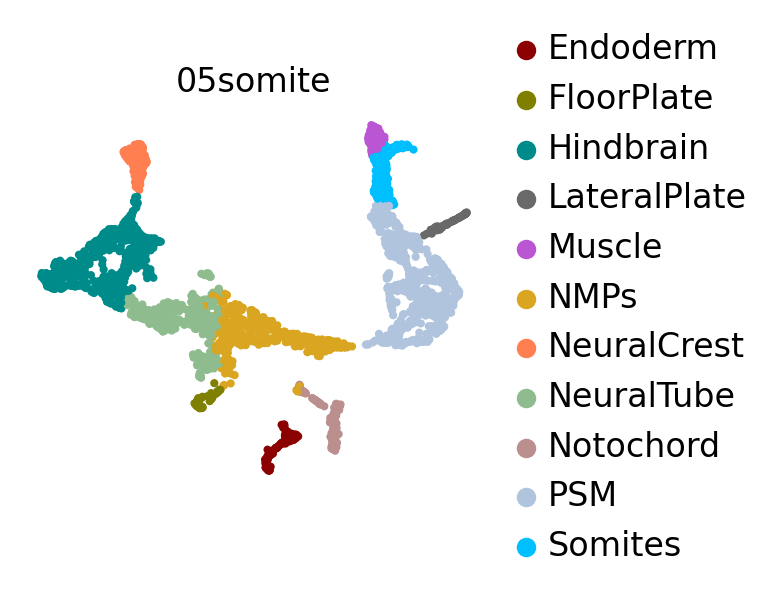

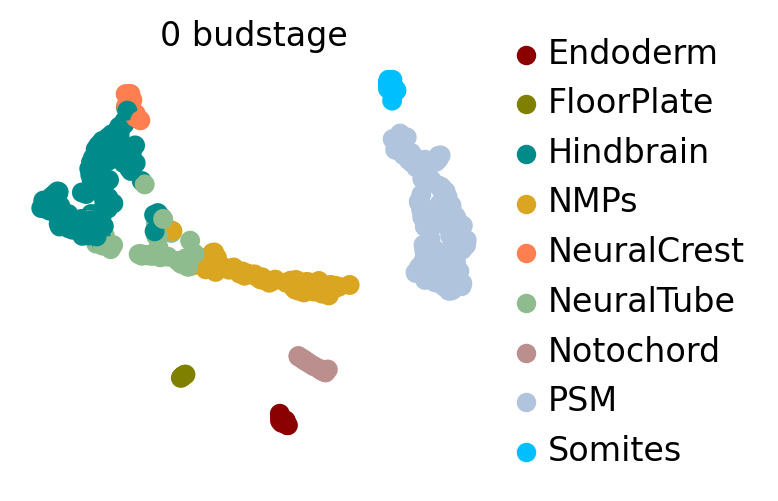

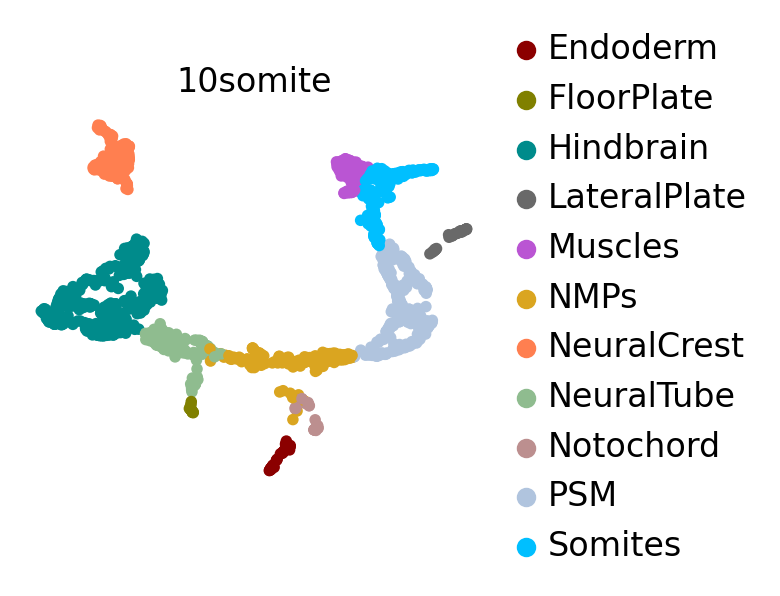

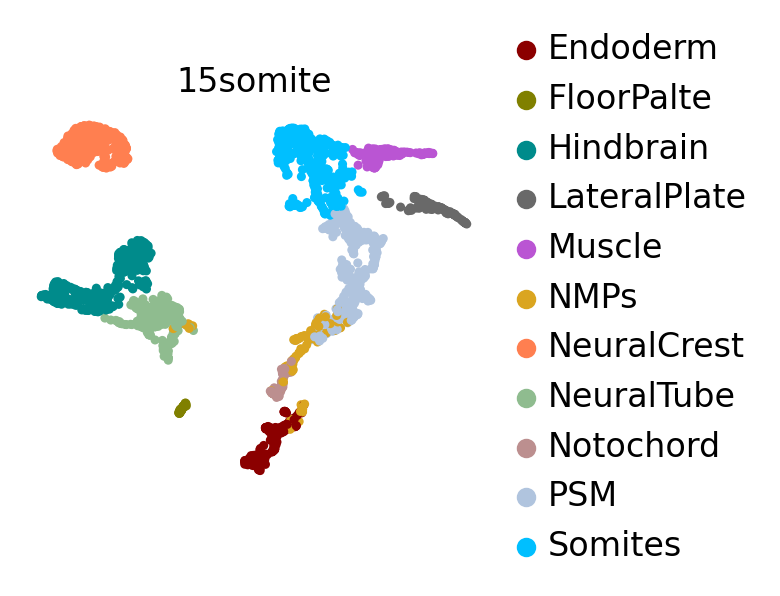

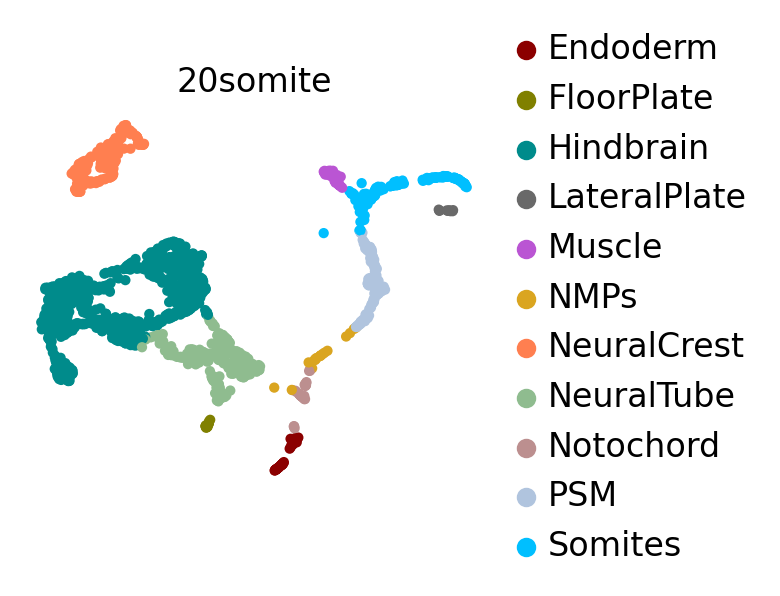

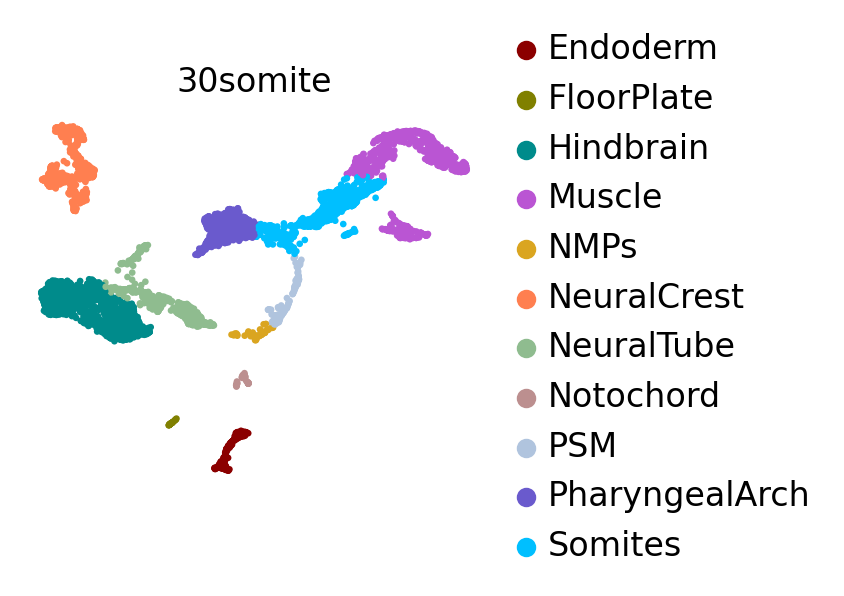

In [581]:
for i in range(len(adata_list)):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(3,2.5))

    sc.pl.umap(adata_list[i], color='Annotations_IndivTimePoint', add_outline=False, legend_loc='right margin',
                   legend_fontsize=12, legend_fontoutline=2,frameon=False,
                   title=adata_list[i].obs.timepoint[0], 
                   ax=ax, show = False)

    plt.show() 
    
    fig.savefig('figures/UMAP_'+  adata_list[i].obs.timepoint[0]+ '_cellannotation.png', dpi=400, bbox_inches='tight', transparent=True)


In [445]:
velocity_timepoint_path = '/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/timepoints/aligned_UMAP/with_velocity_final/'

for a in adata_list:
    if 'gene_name' in a.var.columns.tolist():
        a.var.set_index('gene_name',inplace = True)
    
    a.write(velocity_timepoint_path + a.obs['timepoint'][0] + '_velocity_aligned.h5ad')

In [614]:
adata_list[0]

AnnData object with n_obs × n_vars = 3464 × 3000
    obs: '10X_run', 'barcode', 'batch', 'cell_annotation', 'cell_id', 'cell_id2', 'clusters', 'global_annotation', 'timepoint', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'terminal_states', 'terminal_states_probs', 'clusters_gradients', 'Cells_Annotations', 'Annotations_IndivTimePoint'
    var: 'dispersions', 'dispersions_norm', 'gene_id', 'highly_variable', 'mean', 'means', 'n_cells', 'std', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score'
    uns: 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'global_annotation_colors', 'clusters_colors', 'rank_velocity_genes', 'T_fwd_params', 'eigendecomposition_fwd', 'schur_matrix_fwd', 'terminal_states_colors

## Transfer new annotations
Apr 26 2022

* Filter out fish from 30 somite 
* Check that cell_id matches across all cells 
* Transfer new annotations
* Re-pot UMAPs

In [364]:
adata.obs['fish'] = [c.split('_')[0] for c in adata.obs.cell_id]

In [366]:
adata.obs.head()

,10X_run,barcode,batch,cell_annotation,cell_id,cell_id2,clusters,global_annotation,timepoint,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition,Cells_Annotations,fish
0,TDR18,AAACCCAAGGCGAAGG,1,hindbrain_sox19a.mdkb.mex3b,TDR18_AAACCCAAGGCGAAGG-1,TDR18_AAACCCAAGGCGAAGG-1,12,Neural_Posterior,10somite,41100.0,9283.0,41100.0,30501.064453,0.282471,Hindbrain,TDR18
1,TDR18,AAAGGGCAGATGACAT,1,PSM_msgn1,TDR18_AAAGGGCAGATGACAT-1,TDR18_AAAGGGCAGATGACAT-1,1,PSM,10somite,21524.0,9238.0,21524.0,28776.351562,0.144779,PSM,TDR18
2,TDR18,AAAGGGCAGGCCCAAA,1,Somites_meox1,TDR18_AAAGGGCAGGCCCAAA-1,TDR18_AAAGGGCAGGCCCAAA-1,11,Somites,10somite,41799.0,5257.0,41799.0,30667.578125,0.110335,PSM,TDR18
3,TDR18,AAAGGTAAGATACGAT,1,PSM_msgn1,TDR18_AAAGGTAAGATACGAT-1,TDR18_AAAGGTAAGATACGAT-1,1,PSM,10somite,42415.0,7747.0,42415.0,29871.021484,0.176677,PSM,TDR18
4,TDR18,AAAGGTACAGTATTCG,1,PSM_msgn1,TDR18_AAAGGTACAGTATTCG-1,TDR18_AAAGGTACAGTATTCG-1,11,PSM,10somite,31686.0,5258.0,31686.0,30816.904297,0.119291,PSM,TDR18


In [368]:
adata[adata.obs.timepoint=='30somite'].obs.fish.value_counts()

TDR44    2133
TDR46    1607
TDR43     900
TDR45     608
TDR32     137
TDR33     136
TDR31      95
TDR34      33
Name: fish, dtype: int64

Remove old fish samples for 30 somites

In [378]:
adata_fil = adata[~adata.obs['fish'].isin( ['TDR31', 'TDR32','TDR33','TDR34'])]

In [370]:
adata_list[5].obs['10X_run'].value_counts()

TDR44    2133
TDR46    1607
TDR43     900
TDR45     608
Name: 10X_run, dtype: int64

In [384]:
adata_fil[adata_fil.obs.timepoint=='30somite'].obs['fish'].value_counts()

TDR44    2133
TDR46    1607
TDR43     900
TDR45     608
Name: fish, dtype: int64

In [390]:
timepoint_list  =[d.obs.timepoint[0] for d in adata_list]
timepoint_list

['05somite', '0 budstage', '10somite', '15somite', '20somite', '30somite']

Sanity checks

In [385]:
which_timepoint = '30somite'
global_id = adata_fil[adata_fil.obs.timepoint==which_timepoint].obs.cell_id
ind_id = adata_list[5].obs.cell_id

p=0
for i in range(len(global_id)):
    if(global_id[i]==ind_id[i]):
        p= p+1

In [386]:
p

5248

In [387]:
adata_list[5].shape

(5248, 3000)

In [389]:
adata_fil[adata_fil.obs.timepoint==which_timepoint].shape

(5248, 3000)

Actually save the annotations

In [395]:
for i in range(len(adata_list)):
    adata_list[i].obs['Cells_Annotations'] = adata_fil[adata_fil.obs['timepoint']==timepoint_list[i]].obs['Cells_Annotations'].astype(str).values
    

WE can transfer the alinged UMAPS back to the original count matrix (with sox2) 

In [472]:
adata_fil.obs.head()

,10X_run,barcode,batch,cell_annotation,cell_id,cell_id2,clusters,global_annotation,timepoint,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition,Cells_Annotations,fish
0,TDR18,AAACCCAAGGCGAAGG,1,hindbrain_sox19a.mdkb.mex3b,TDR18_AAACCCAAGGCGAAGG-1,TDR18_AAACCCAAGGCGAAGG-1,12,Neural_Posterior,10somite,41100.0,9283.0,41100.0,30501.064453,0.282471,Hindbrain,TDR18
1,TDR18,AAAGGGCAGATGACAT,1,PSM_msgn1,TDR18_AAAGGGCAGATGACAT-1,TDR18_AAAGGGCAGATGACAT-1,1,PSM,10somite,21524.0,9238.0,21524.0,28776.351562,0.144779,PSM,TDR18
2,TDR18,AAAGGGCAGGCCCAAA,1,Somites_meox1,TDR18_AAAGGGCAGGCCCAAA-1,TDR18_AAAGGGCAGGCCCAAA-1,11,Somites,10somite,41799.0,5257.0,41799.0,30667.578125,0.110335,PSM,TDR18
3,TDR18,AAAGGTAAGATACGAT,1,PSM_msgn1,TDR18_AAAGGTAAGATACGAT-1,TDR18_AAAGGTAAGATACGAT-1,1,PSM,10somite,42415.0,7747.0,42415.0,29871.021484,0.176677,PSM,TDR18
4,TDR18,AAAGGTACAGTATTCG,1,PSM_msgn1,TDR18_AAAGGTACAGTATTCG-1,TDR18_AAAGGTACAGTATTCG-1,11,PSM,10somite,31686.0,5258.0,31686.0,30816.904297,0.119291,PSM,TDR18


In [496]:
adata_ann_fil = adata_ann[adata_fil.obs['cell_id']].copy()
adata_ann_fil.obs['timepoint'] = adata_ann_fil.obs['timepoint'].astype(str) 

adata_ann_fil.obs.loc[adata_ann_fil.obs.timepoint=='5somite','timepoint'] = '05somite'


adata_list_sox2 = []
for i in range(len(timepoint_list)): 
    a = adata_ann_fil[adata_ann_fil.obs['timepoint']==timepoint_list[i]].copy()
    a.obsm['X_umap'] =adata_list[i].obsm['X_umap']
    adata_list_sox2.append(a)    
    

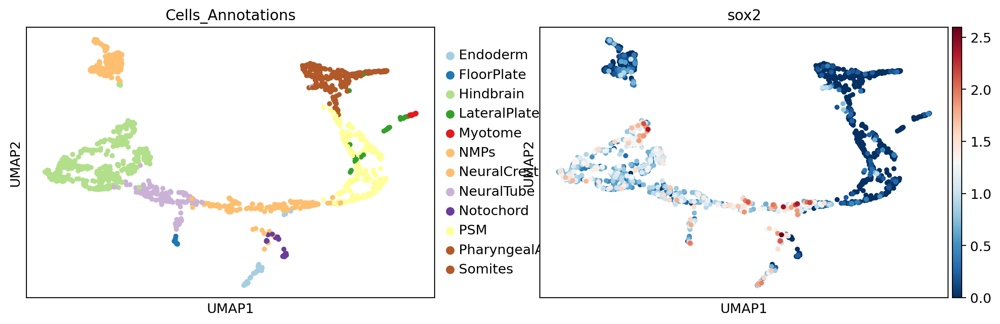

In [508]:
sc.pl.umap(adata_list_sox2[2], color = ['Cells_Annotations','sox2'])

## Save v1 umaps 
April 28th <br>
Aligned UMAPS with sox2 (full count matrix) 

In [507]:
# save v2 umaps in a new directory for all timepoints 
data_path = '/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/nmps/timepoints/aligned_UMAP/with_sox2_counts/'
for idx, a in enumerate(adata_list_sox2): 
    #adata_test.obs['leiden_cluster'] = adata_test.obs['seurat_clusters'].astype(str)
    adata_list_sox2[idx].write( data_path + adata_list_sox2[idx].obs.timepoint[0] + '.h5ad')

... storing 'timepoint' as categorical


# Gene expression dynamics at one time point

In [121]:
adata_list[0].var.set_index('gene_name',inplace = True)

AnnData object with n_obs × n_vars = 3464 × 3000
    obs: '10X_run', 'barcode', 'batch', 'cell_annotation', 'cell_id', 'cell_id2', 'clusters', 'global_annotation', 'timepoint', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'dispersions', 'dispersions_norm', 'gene_id', 'gene_name', 'highly_variable', 'mean', 'means', 'n_cells', 'std', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'global_annotation_colors'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'counts', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

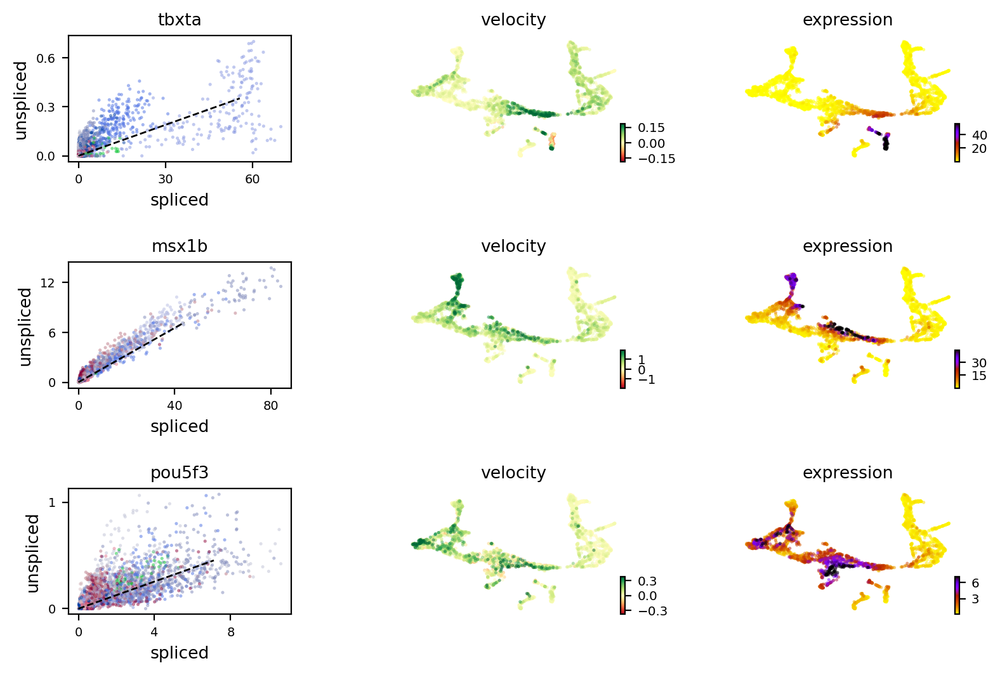

In [143]:
scv.pl.velocity(adata_list[0], var_names=['tbxta','msx1b','pou5f3'])

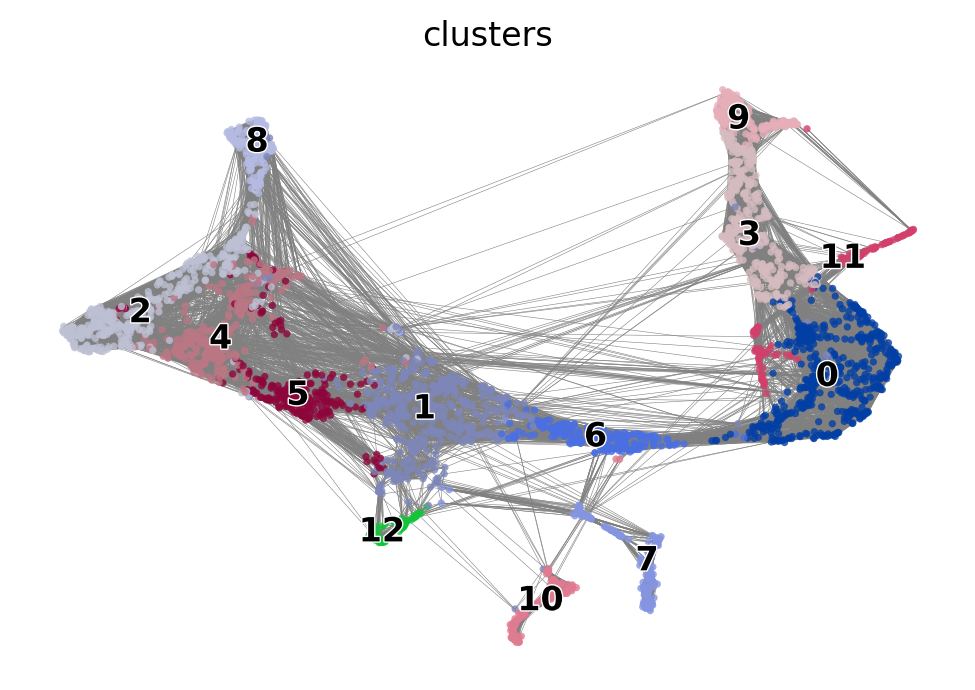

In [134]:
scv.pl.velocity_graph(adata_list[0])

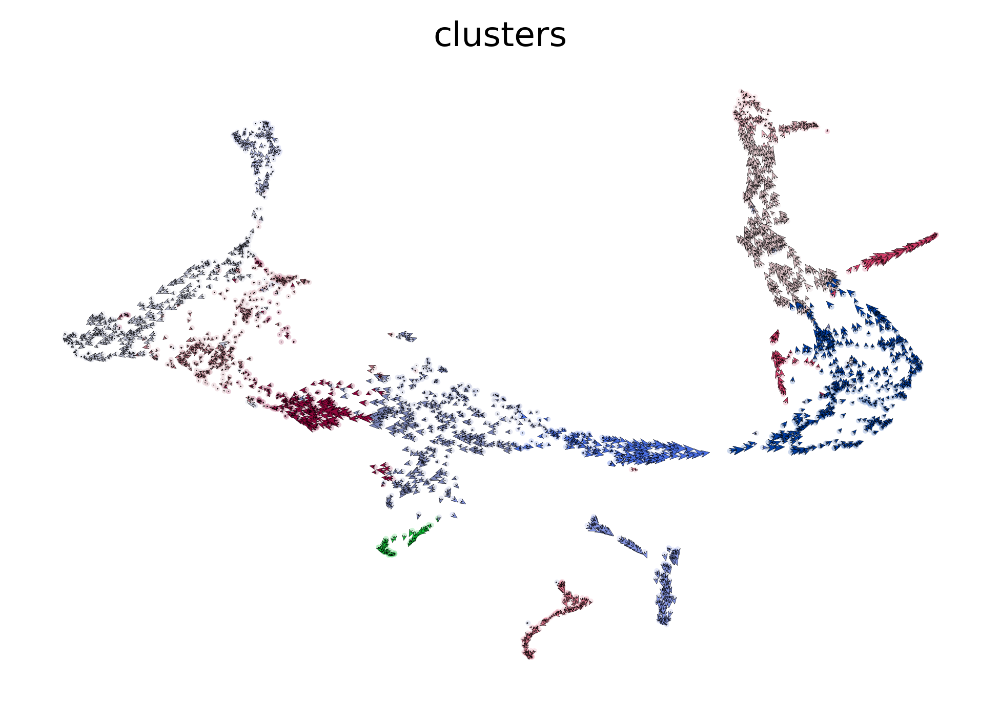

In [137]:
scv.pl.velocity_embedding(adata_list[0], arrow_length=3, arrow_size=2, dpi=200)


In [144]:
scv.tl.rank_velocity_genes(adata_list[0], groupby='clusters', min_corr=.3)

df = scv.DataFrame(adata_list[0].uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:03) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,XKR4,celsr1a,adgrv1,col4a2,ccser2a,notch1b,kif26ab,prdm5,zfhx4,zgc:158328,atp8b1,phldb1a,rassf7b
1,her1,hoxc6b,cntfr,rras2,zbtb16b,cxadr,sulf1,arhgap24,prex2,lrig1,gfra1a,palld,lrrc6
2,itga5,SSBP4,strbp,plpp1a,ncoa3,brf1a,gdf11,kank1a,acvr1ba,adcy7,myh9b,ttn.2,kirrel1b
3,plp2,rab11fip4a,rgs3b,fermt2,jag2b,madd,ppp1r14c,palm2akap2,tle2a,lama4,crim1,itga5,akna
4,vash2,apela,ntn1a,hs6st1b,CT990561.1,myt1a,gria1b,si:dkey-22o22.2,fscn1a,dock9b,myh7bb,fstl1b,pacrg


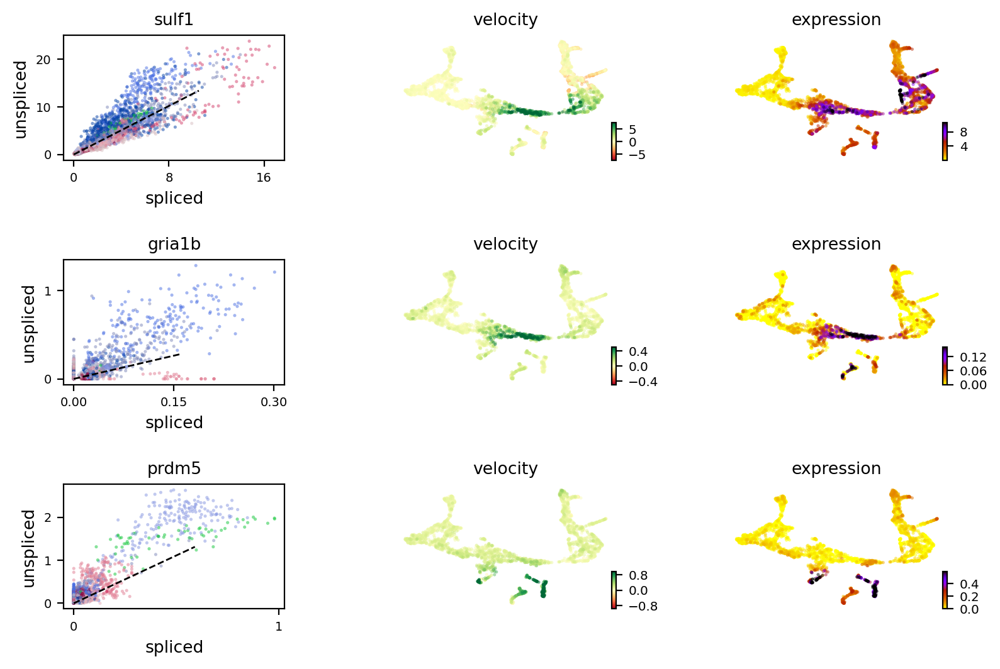

In [149]:
scv.pl.velocity(adata_list[0], var_names=['sulf1','gria1b','prdm5'])

Which clusters have the most NMPs

In [148]:
adata_list[0][adata_list[0].obs.global_annotation=='NMPs'].obs.clusters.value_counts()

6     162
1      13
7      13
12      2
Name: clusters, dtype: int64

Two more useful stats: - The **speed or rate of differentiation** is given by the length of the velocity vector. - The **coherence** of the vector field (i.e., how a velocity vector correlates with its neighboring velocities) provides a measure of confidence.

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)


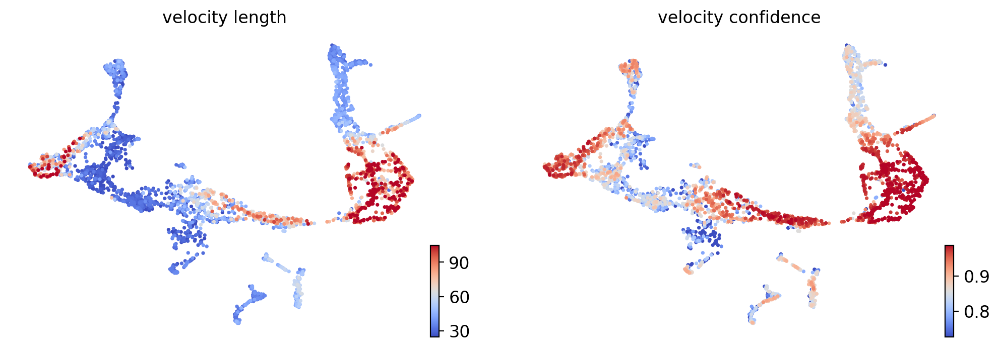

In [619]:
scv.tl.velocity_confidence(adata_list[0])
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_list[0], c=keys, cmap='coolwarm', perc=[5, 95])


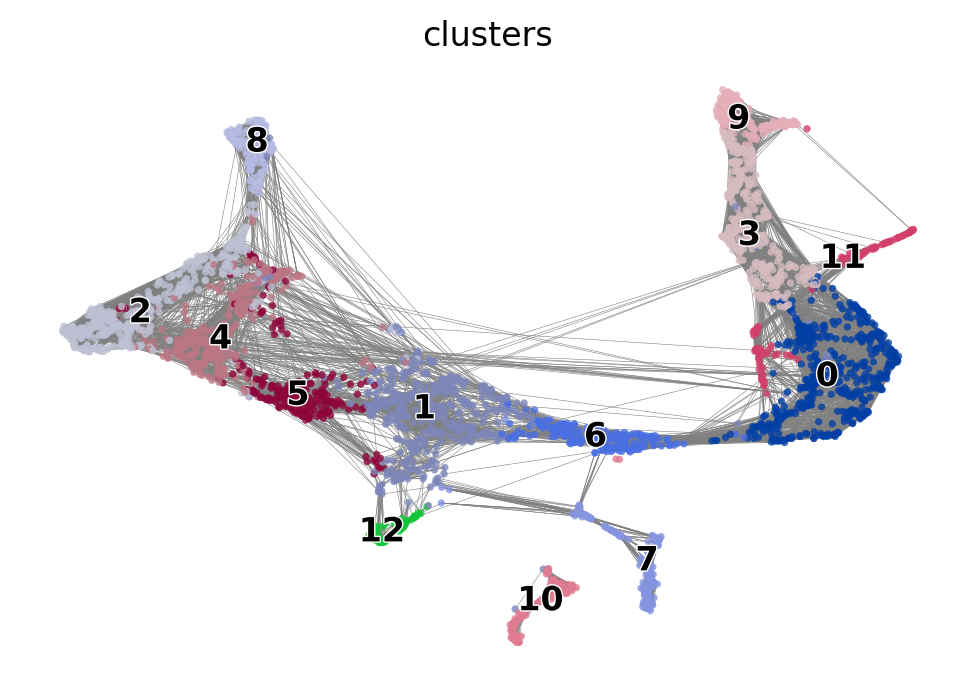

In [151]:
scv.pl.velocity_graph(adata_list[0], threshold=.1)

In [152]:
adata_list[0].obs.head()

,10X_run,barcode,batch,cell_annotation,cell_id,cell_id2,clusters,global_annotation,timepoint,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition,velocity_length,velocity_confidence,velocity_confidence_transition
0,TDR35,AAACGAAAGCATGCAG,0,SpinalCord_cdx3.fgf8a.smad3,TDR35_AAACGAAAGCATGCAG-1,TDR35_AAACGAAAGCATGCAG-1,1,Neural_Posterior,05somite,91787.0,11838.0,91787.0,35016.140625,0.213119,69.779999,0.921341,0.014565
1,TDR35,AAACGAAGTAAGCGGT,0,PSM_msgn1,TDR35_AAACGAAGTAAGCGGT-1,TDR35_AAACGAAGTAAGCGGT-1,0,PSM,05somite,39818.0,7442.0,39818.0,34505.214844,0.055327,79.370003,0.976057,0.080316
2,TDR35,AAAGGATCATAGCACT,0,NMPs_sox2_tbxta,TDR35_AAAGGATCATAGCACT-1,TDR35_AAAGGATCATAGCACT-1,1,NMPs,05somite,54791.0,6927.0,54791.0,34801.300781,0.177558,27.230000,0.614617,0.120340
3,TDR35,AAAGGTAAGGGCCCTT,0,PSM_msgn1,TDR35_AAAGGTAAGGGCCCTT-1,TDR35_AAAGGTAAGGGCCCTT-1,0,PSM,05somite,51283.0,9852.0,51283.0,34060.070312,0.097165,75.970001,0.963161,0.071388
4,TDR35,AAAGGTAGTCTACTGA,0,HindbrainPosterior_NeuralPlate.wnt11.hoxa4a.ho...,TDR35_AAAGGTAGTCTACTGA-1,TDR35_AAAGGTAGTCTACTGA-1,4,Neural_Posterior,05somite,79251.0,11412.0,79251.0,34864.558594,0.305184,26.790001,0.809551,0.002714


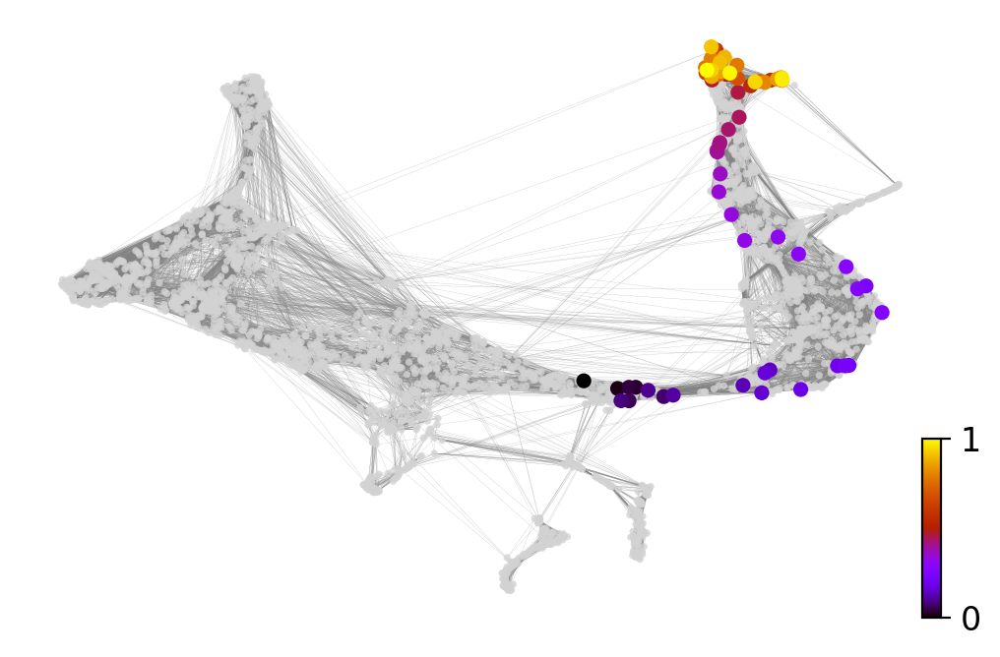

In [163]:
x, y = scv.utils.get_cell_transitions(adata_list[0], basis='umap', starting_cell=21)
ax = scv.pl.velocity_graph(adata_list[0], c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata_list[0], x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)


In [161]:
adata_list[0][adata_list[0].obs.global_annotation=='NMPs'].obs

,10X_run,barcode,batch,cell_annotation,cell_id,cell_id2,clusters,global_annotation,timepoint,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition,velocity_length,velocity_confidence,velocity_confidence_transition,root_cells,end_points,velocity_pseudotime
2,TDR35,AAAGGATCATAGCACT,0,NMPs_sox2_tbxta,TDR35_AAAGGATCATAGCACT-1,TDR35_AAAGGATCATAGCACT-1,1,NMPs,05somite,54791.0,6927.0,54791.0,34801.300781,0.177558,27.230000,0.614617,0.120340,0.268807,0.001873,0.860177
21,TDR35,AATGGAACAGCCGTCA,0,NMPs_sox2_tbxta,TDR35_AATGGAACAGCCGTCA-1,TDR35_AATGGAACAGCCGTCA-1,6,NMPs,05somite,36199.0,3828.0,36199.0,34983.773438,0.159089,76.669998,0.979545,0.061882,0.134446,0.002311,0.842390
26,TDR35,ACAGAAACACGTATAC,0,NMPs_sox2_tbxta,TDR35_ACAGAAACACGTATAC-1,TDR35_ACAGAAACACGTATAC-1,6,NMPs,05somite,67352.0,13937.0,67352.0,34392.210938,0.200186,67.599998,0.975771,0.043634,0.098630,0.002730,0.828341
32,TDR35,ACATGCAGTAGTTACC,0,NMPs_sox2_tbxta,TDR35_ACATGCAGTAGTTACC-1,TDR35_ACATGCAGTAGTTACC-1,6,NMPs,05somite,50290.0,11188.0,50290.0,33543.207031,0.259511,60.580002,0.941165,0.007201,0.061250,0.009723,0.867132
43,TDR35,ACGCACGAGCATGAAT,0,NMPs_sox2_tbxta,TDR35_ACGCACGAGCATGAAT-1,TDR35_ACGCACGAGCATGAAT-1,7,NMPs,05somite,55895.0,11244.0,55895.0,34591.535156,0.122623,41.500000,0.748200,0.156360,0.210324,0.000727,0.837409
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3432,TDR38,TTCCGTGAGCTTAAGA,0,NMPs_sox2_tbxta,TDR38_TTCCGTGAGCTTAAGA-1,TDR38_TTCCGTGAGCTTAAGA-1,6,NMPs,05somite,44161.0,6147.0,44161.0,34581.160156,0.170867,94.989998,0.983570,0.030515,0.181235,0.002628,0.856120
3437,TDR38,TTCGGTCGTACGAGTG,0,NMPs_sox2_tbxta,TDR38_TTCGGTCGTACGAGTG-1,TDR38_TTCGGTCGTACGAGTG-1,6,NMPs,05somite,34309.0,2749.0,34309.0,35441.101562,0.079996,64.690002,0.966205,0.068840,0.205473,0.002259,0.856149
3439,TDR38,TTCTAGTAGTACGAGC,0,NMPs_sox2_tbxta,TDR38_TTCTAGTAGTACGAGC-1,TDR38_TTCTAGTAGTACGAGC-1,6,NMPs,05somite,26549.0,5067.0,26549.0,34677.210938,0.161431,78.459999,0.980322,0.054077,0.115166,0.002193,0.824424
3446,TDR38,TTGATGGAGACGGATC,0,NMPs_sox2_tbxta,TDR38_TTGATGGAGACGGATC-1,TDR38_TTGATGGAGACGGATC-1,6,NMPs,05somite,39795.0,7324.0,39795.0,34582.187500,0.188752,89.129997,0.976436,0.044780,0.102085,0.002793,0.826181


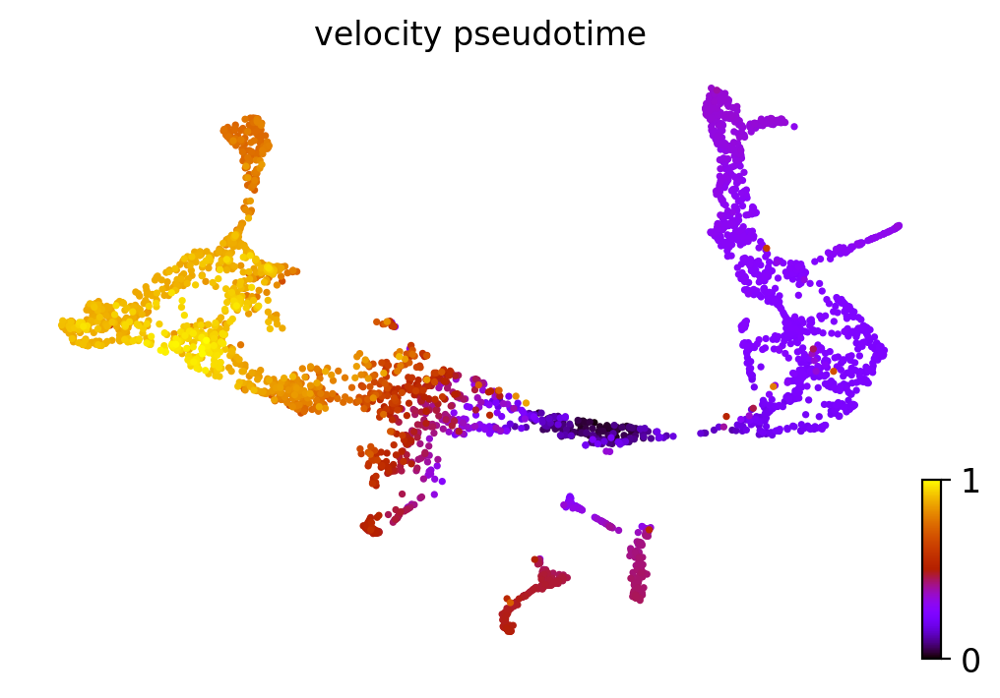

In [164]:
scv.tl.velocity_pseudotime(adata_list[0], root_key =21 , end_key = )
scv.pl.scatter(adata_list[0], color='velocity_pseudotime', cmap='gnuplot')


Let's try CellRank

In [167]:
import cellrank as cr
cr.tl.terminal_states(adata_list[0], cluster_key="clusters", weight_connectivities=0.2)


/tmp/ipykernel_82624/1883980693.py:2: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata_list[0], cluster_key="clusters", weight_connectivities=0.2)
/data/alejandro/miniconda3/envs/cellrank/lib/python3.8/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/3464 [00:00<?, ?cell/s]

  0%|          | 0/3464 [00:00<?, ?cell/s]

Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000033e+00 -8.6939899368622918e-04 2.3959669835751861e-04 -7.7550477733528045e-04 -7.1920928254434291e-04 1.1513256832155908e-03 1.2877100193009737e-02 
0.0000000000000000e+00 9.9974232590036327e-01 -6.4817781330274926e-04 -5.2471384147285808e-04 -6.2655378817559328e-05 1.3224341165001493e-04 -8.4464201521514712e-04 
0.0000000000000000e+00 0.0000000000000000e+00 9.9827824651537356e-01 -2.0036518224180767e-05 5.0126711109257406e-04 2.0758778008930225e-04 -6.2093590909479447e-03 
0.0000000000000000e+00 0.0000000000000000e+00 4.0362393844670282e-04 9.9827824651537356e-01 1.0605029796688372e-03 -1.2597665734515219e-05 -1.0176481283907021e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.9708211288845827e-01 4.2991062904392630e-04 4.1590101422637298e-03 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.9122830367818349e

In [168]:
cr.tl.lineages(adata_list[0], n_jobs=1, backend='threading')


/tmp/ipykernel_82624/1053665483.py:1: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata_list[0], n_jobs=1, backend='threading')


  0%|          | 0/7 [00:00<?, ?/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind
[0]PETSC ERROR: or try http://valgrind.org on GNU/linux and Apple Mac OS X to find memory corruption errors
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


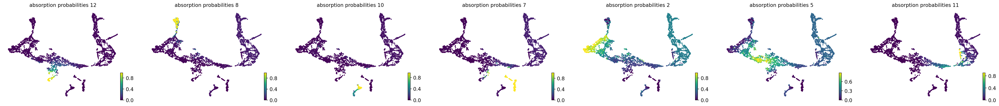

In [169]:
cr.pl.lineages(adata_list[0], same_plot=False)


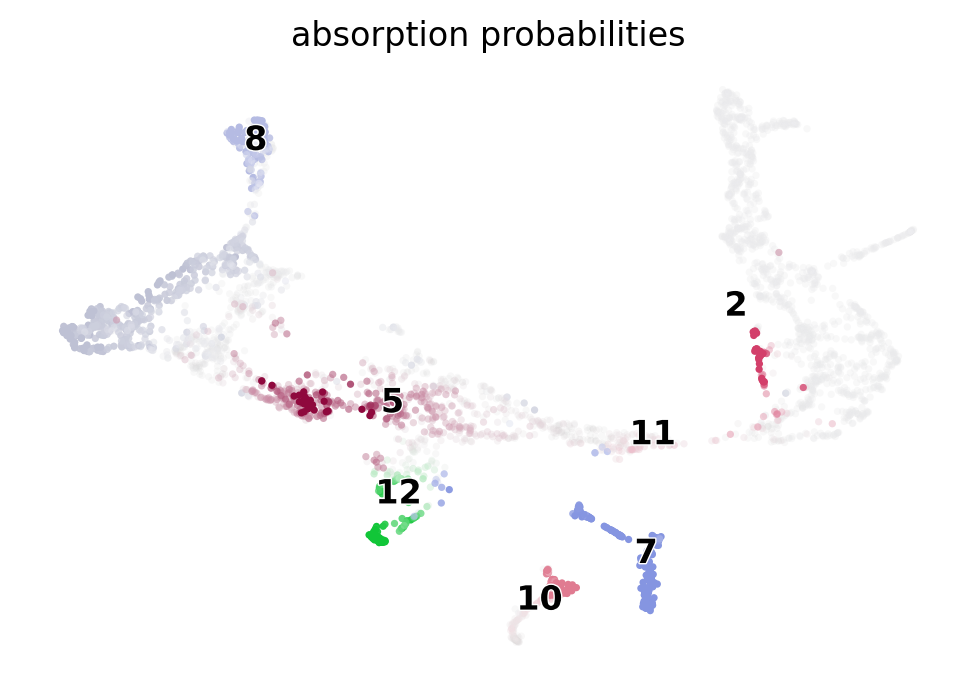

In [170]:
cr.pl.lineages(adata_list[0], same_plot=True)


# Average NMP velocity (mesodermal vs neuronal) 

In [839]:
len(adata_list)

6

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)


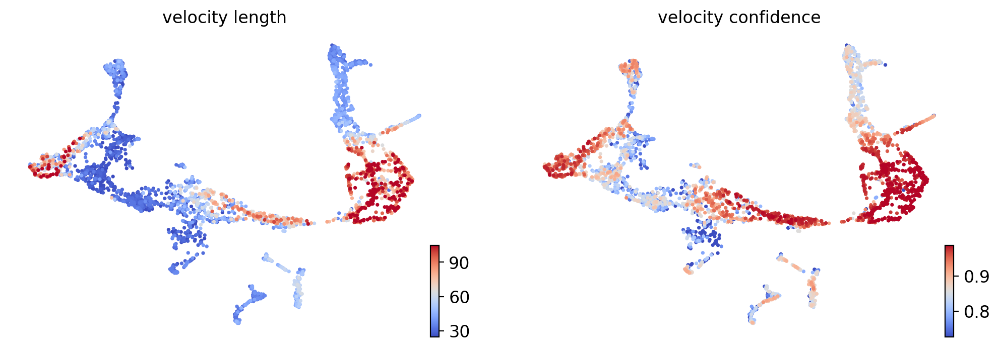

In [859]:
i = 0

scv.tl.velocity_confidence(adata_list[i])
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_list[i], c=keys, cmap='coolwarm', perc=[5, 95])


In [623]:
adata_0 = adata_list[0].copy() 

In [644]:
adata_0

AnnData object with n_obs × n_vars = 3464 × 3000
    obs: '10X_run', 'barcode', 'batch', 'cell_annotation', 'cell_id', 'cell_id2', 'clusters', 'global_annotation', 'timepoint', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'terminal_states', 'terminal_states_probs', 'clusters_gradients', 'Cells_Annotations', 'Annotations_IndivTimePoint'
    var: 'dispersions', 'dispersions_norm', 'gene_id', 'highly_variable', 'mean', 'means', 'n_cells', 'std', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score'
    uns: 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'global_annotation_colors', 'clusters_colors', 'rank_velocity_genes', 'T_fwd_params', 'eigendecomposition_fwd', 'schur_matrix_fwd', 'terminal_states_colors

In [633]:
adata_0.uns['velocity_params']

{'mode': 'stochastic',
 'fit_offset': False,
 'perc': [5, 95],
 'mode_neighbors': 'distances',
 'n_recurse_neighbors': 2,
 'embeddings': ['umap']}

In [640]:
adata_0.uns['velocity_graph'].toarray()[1:10,1:10]

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.04890238, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.10112479, 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],


In [646]:
adata_0.obsm['schur_vectors_fwd'][1:10,:]

array([[ 1.        ,  0.55961542,  0.09031747,  1.16422804, -0.16448168,
         0.13977854,  0.04843308],
       [ 1.        , -3.03987865,  0.08213659,  0.39307568, -0.40566791,
         0.02088357,  0.30583165],
       [ 1.        ,  0.56580007,  0.08935874,  1.16274638, -0.16311423,
         0.14278028,  0.04523594],
       [ 1.        ,  0.20126308, -0.07350505, -0.96562135,  0.90711462,
         0.42793698, -0.32617874],
       [ 1.        ,  0.17119834,  0.08354356, -0.36547782,  0.64669543,
        -4.71722444,  0.41602496],
       [ 1.        ,  0.17251297,  0.08480121, -0.39068325,  0.65527582,
        -4.67103518,  0.39799581],
       [ 1.        ,  0.18727959, -0.10106213, -0.95548735,  0.88228615,
         0.36994411, -1.01096579],
       [ 1.        ,  0.68631693,  2.48174148, -1.97309123, -4.06269308,
        -0.08395647, -0.05035296],
       [ 1.        ,  0.16189112,  0.08226457, -0.38858251,  0.62632141,
        -4.25372761,  0.31259575]])

In [626]:
adata_0.obs.columns

Index(['10X_run', 'barcode', 'batch', 'cell_annotation', 'cell_id', 'cell_id2',
       'clusters', 'global_annotation', 'timepoint', 'initial_size_spliced',
       'initial_size_unspliced', 'initial_size', 'n_counts',
       'velocity_self_transition', 'velocity_length', 'velocity_confidence',
       'velocity_confidence_transition', 'root_cells', 'end_points',
       'velocity_pseudotime', 'terminal_states', 'terminal_states_probs',
       'clusters_gradients', 'Cells_Annotations',
       'Annotations_IndivTimePoint'],
      dtype='object')

In [627]:
adata_0.obs.head() 

,10X_run,barcode,batch,cell_annotation,cell_id,cell_id2,clusters,global_annotation,timepoint,initial_size_spliced,...,velocity_confidence,velocity_confidence_transition,root_cells,end_points,velocity_pseudotime,terminal_states,terminal_states_probs,clusters_gradients,Cells_Annotations,Annotations_IndivTimePoint
0,TDR35,AAACGAAAGCATGCAG,0,SpinalCord_cdx3.fgf8a.smad3,TDR35_AAACGAAAGCATGCAG-1,TDR35_AAACGAAAGCATGCAG-1,1,Neural_Posterior,05somite,91787.0,...,0.921341,0.014565,0.174544,0.014205,0.587989,NaN,0.630082,5,NMPs,NMPs
1,TDR35,AAACGAAGTAAGCGGT,0,PSM_msgn1,TDR35_AAACGAAGTAAGCGGT-1,TDR35_AAACGAAGTAAGCGGT-1,0,PSM,05somite,39818.0,...,0.976057,0.080316,0.021223,0.000591,0.240394,NaN,0.982400,2,PSM,PSM
2,TDR35,AAAGGATCATAGCACT,0,NMPs_sox2_tbxta,TDR35_AAAGGATCATAGCACT-1,TDR35_AAAGGATCATAGCACT-1,1,NMPs,05somite,54791.0,...,0.614617,0.120340,0.268807,0.001873,0.340697,NaN,0.719792,7,NMPs,NMPs
3,TDR35,AAAGGTAAGGGCCCTT,0,PSM_msgn1,TDR35_AAAGGTAAGGGCCCTT-1,TDR35_AAAGGTAAGGGCCCTT-1,0,PSM,05somite,51283.0,...,0.963161,0.071388,0.006064,0.001215,0.249585,NaN,0.982992,2,PSM,PSM
4,TDR35,AAAGGTAGTCTACTGA,0,HindbrainPosterior_NeuralPlate.wnt11.hoxa4a.ho...,TDR35_AAAGGTAGTCTACTGA-1,TDR35_AAAGGTAGTCTACTGA-1,4,Neural_Posterior,05somite,79251.0,...,0.809551,0.002714,0.001187,1.000000,0.967836,NaN,0.606388,2,Hindbrain,Hindbrain


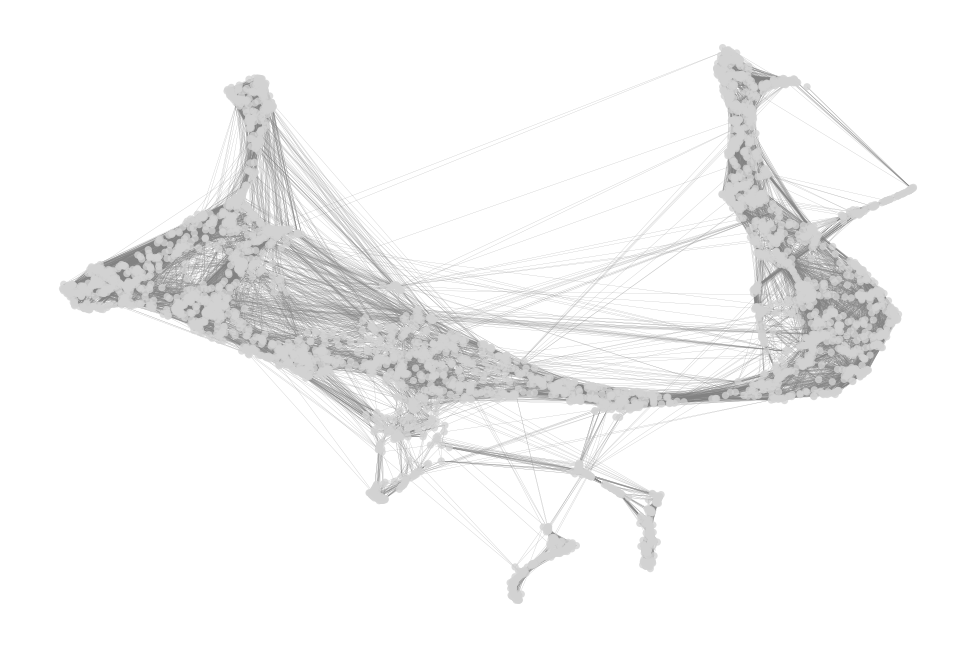

In [649]:
ax = scv.pl.velocity_graph(adata_0, c='lightgrey', edge_width=.05, show=False)

In [ ]:
adata_0.uns['velocity_graph'].toarray()[1:10,1:10]

In [653]:
nmp_graph = adata_0.uns['velocity_graph'].toarray()[adata_0.obs['Cells_Annotations']=='NMPs',:]

In [654]:
nmp_graph.shape

(471, 3464)

<AxesSubplot:ylabel='Count'>

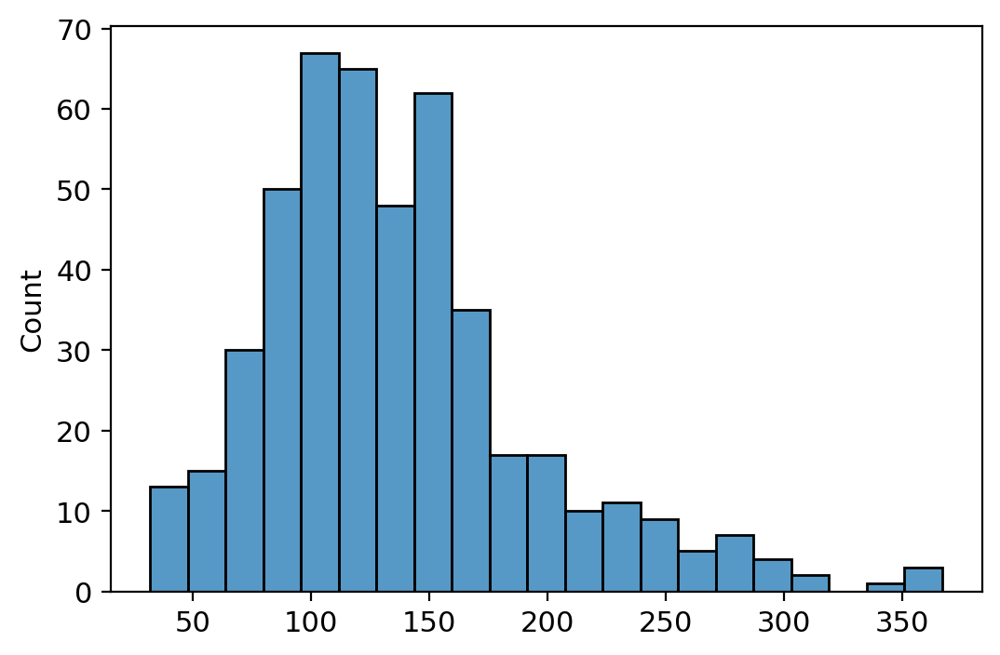

In [661]:
# number of neighbors in the graph by cell 
import seaborn as sns
sns.histplot(np.sum(nmp_graph>0, axis =1))

Let's make a dataframe with the identity of the neighbors (how many of each cell type) **for one cell!**

In [827]:
adata_list[3].obs['Cells_Annotations'].value_counts() 

Hindbrain        483
Somites          418
NeuralCrest      404
PSM              343
NeuralTube       266
Endoderm         219
PharyngealArc    200
NMPs             129
Myotome          112
Notochord        111
LateralPlate      66
FloorPlate        54
Muscle            10
Name: Cells_Annotations, dtype: int64

Let's find all unique annotations (might include typos) 

In [904]:
unique_labs = set()
for ad in adata_list: 
    unique_labs.update(set(ad.obs['Annotations_IndivTimePoint']) )

In [905]:
unique_labs

{'Endoderm',
 'FloorPalte',
 'FloorPlate',
 'Hindbrain',
 'LateralPlate',
 'Muscle',
 'Muscles',
 'NMPs',
 'NeuralCrest',
 'NeuralTube',
 'Notochord',
 'PSM',
 'PharyngealArch',
 'Somites'}

In [906]:
# Make lineage obs
def add_fate_obs(adata_0 = [], var_name = 'Lineage', ann_name = 'Annotations_IndivTimePoint'):
    adata_0.obs[var_name] ='NMPs'

    neuro = ['Hindbrain','NeuralTube','NeuralCrest','FloorPlate','FloorPalte']
    meso = ['PSM','Somites','PharyngealArch','Myotome','Muscle','Muscles','LateralPlate']

    for n in neuro:
        adata_0.obs[var_name][ adata_0.obs[ann_name] ==n] ='Neuronal'

    for m in meso:
        adata_0.obs[var_name][ adata_0.obs[ann_name] ==m] ='Mesoderm'
    
    return(adata_0)

In [943]:
#Find neighbors in velocity graph and sum their velocity lengths for each cell fate

def velo_neighbors(adata_0 = [], ann_name = 'Annotations_IndivTimePoint', 
                   velo_var = 'velocity_length', 
                   min_w = 0):
    # Subset graph only for NMPs 
    # dimensions:  N_nmp X total_cells
    nmp_graph = adata_0.uns['velocity_graph'].toarray()[adata_0.obs[ann_name]=='NMPs',:]
    n_cells = nmp_graph.shape[0]

    lineage_list = ['NMPs','Neuronal','Mesoderm']

    sum_list = []
    # For each cell, find the top neighbors in the velocity graph and add their velocity length
    # The identity of the neighbors and their velocity length will determine which cell fate is the cell going to 
    for i in range(n_cells):
        # Find neighbors in the original adata (they could be any cell type, including Nmps)
        neigh_df = adata_0[nmp_graph[i,:]>min_w].obs[[ann_name,'velocity_length','velocity_confidence','Lineage']]

        neigh_df['graph_weight'] = nmp_graph[i, nmp_graph[i, :] > min_w ] 
        neigh_df['velo_score'] = neigh_df['velocity_length'] * neigh_df['velocity_confidence']
        neigh_df['velo_score'] = neigh_df['velo_score'] * neigh_df['graph_weight']
        
        lineage_sum = neigh_df.groupby('Lineage')[velo_var].sum()

        # fill missing lineages 
        for n in lineage_list:
            if not n in lineage_sum.index.to_list():
                lineage_sum[n] = 0 

        lineage_sum['neigh'] = neigh_df.shape[0] # Add number of neighbors (in case we want to compute the mean)

        # same order 
        sum_list.append(lineage_sum[lineage_list+['neigh']])

    velo_df  = pd.concat(sum_list, axis = 1, ignore_index = True).transpose()
    velo_df['velo_diff'] = velo_df['Neuronal'] - velo_df['Mesoderm']
    velo_df['log_vel_diff'] = np.log1p(velo_df['Neuronal']) - np.log1p(velo_df['Mesoderm'])

    return(velo_df)

Do it for each timepoint

In [944]:
# Run the functions for all timepoints
velo_df_list = []
for i in range(len(adata_list)):
    ad = add_fate_obs(adata_0 = adata_list[i].copy())
    velo_df = velo_neighbors(adata_0 = ad, velo_var = 'velo_score')

    velo_df['timepoint'] = adata_list[i].obs['timepoint'][0]

    velo_df_list.append(velo_df)

In [945]:
velo_scores_df = pd.concat(velo_df_list, axis = 0)

velod_df = pd.melt(velo_scores_df, id_vars = ['timepoint','neigh'], value_vars = lineage_list + ['velo_diff','log_vel_diff'], 
                   var_name = 'lineage',value_name = 'weight')

In [946]:
velo_scores_df.head()

Lineage,NMPs,Neuronal,Mesoderm,neigh,velo_diff,log_vel_diff,timepoint
0,492.997311,123.641951,0.000000,145.0,123.641951,4.825445,05somite
1,210.423168,72.164596,0.000000,111.0,72.164596,4.292712,05somite
2,693.090166,0.000000,48.429523,100.0,-48.429523,-3.900548,05somite
3,342.538558,0.000000,180.610192,76.0,-180.610192,-5.201863,05somite
4,303.427515,34.086354,2.335796,148.0,31.750558,2.353101,05somite


<AxesSubplot:xlabel='timepoint', ylabel='weight'>

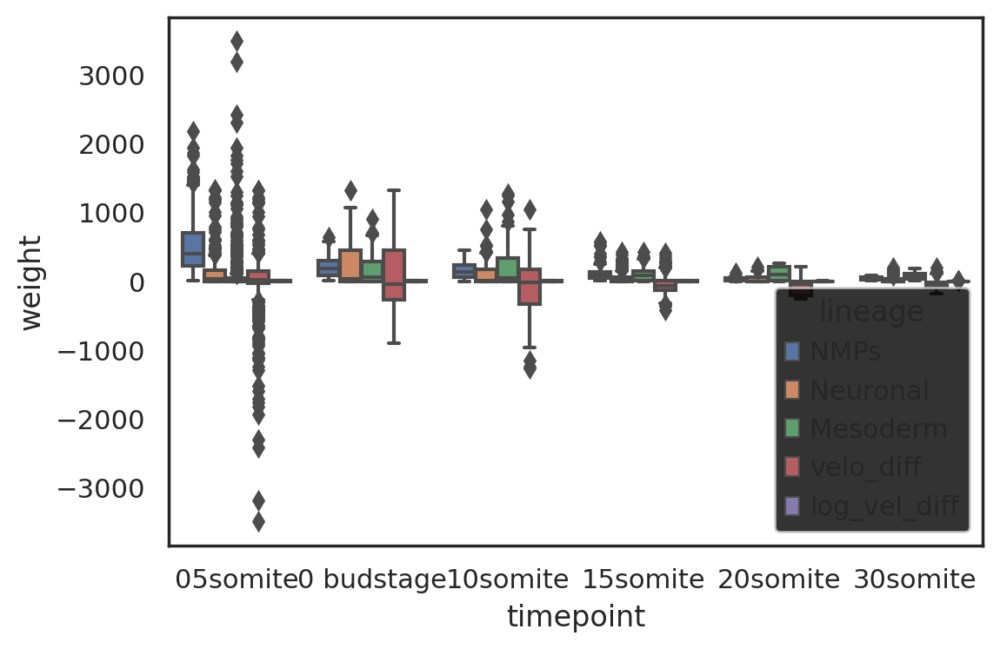

In [947]:
sns.boxplot(data = velod_df, x = 'timepoint' , y = 'weight',hue = 'lineage')


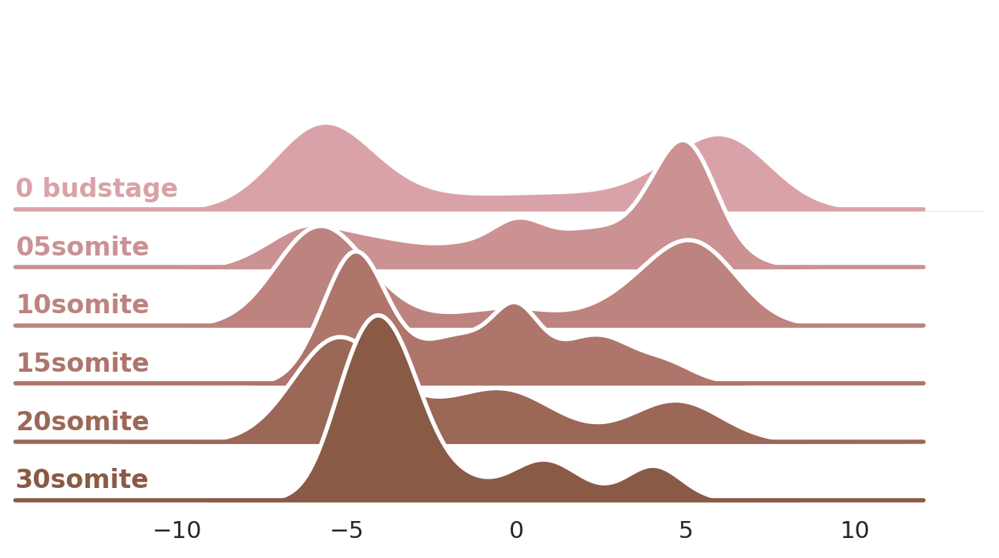

In [951]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


data_df = velod_df[velod_df['lineage']=='log_vel_diff']
data_df.sort_values(by='timepoint',inplace = True)
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

flights = sns.load_dataset('flights')
pal = sns.cubehelix_palette(len(data_df["timepoint"].unique()), start=1.4, rot=-.25, light=.7, dark=.4)
g = sns.FacetGrid(data_df, row="timepoint", hue="timepoint", aspect=10, height=.7, palette=pal)

g.map(sns.kdeplot, "weight", bw_adjust=.6, cut=5, clip_on=False, fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, "weight", bw_adjust=.6, cut=5, clip_on=False, color="w", lw=2)
g.map(plt.axhline, y=0, linewidth=2, linestyle="-", color=None, clip_on=False)

def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .1, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)

g.map(label, "timepoint")
g.fig.subplots_adjust(hspace=-.7)
g.set(yticks=[], xlabel="", ylabel="", xlim=(None, 12), title="")
g.despine(bottom=True, left=True)
plt.show()

In [954]:
g.savefig('figures/Fig3_VelocityDistribution_NMPs.pdf', dpi = 300)  


In [952]:
pwd

'/data/alejandro/danio-atlas/data'

In [949]:
data_df.head() 

,timepoint,neigh,lineage,weight
4235,0 budstage,65.0,log_vel_diff,-4.409405
4237,0 budstage,64.0,log_vel_diff,-4.747521
4238,0 budstage,76.0,log_vel_diff,5.894887
4239,0 budstage,73.0,log_vel_diff,-5.624322
4240,0 budstage,75.0,log_vel_diff,-5.299543


<AxesSubplot:xlabel='timepoint', ylabel='weight'>

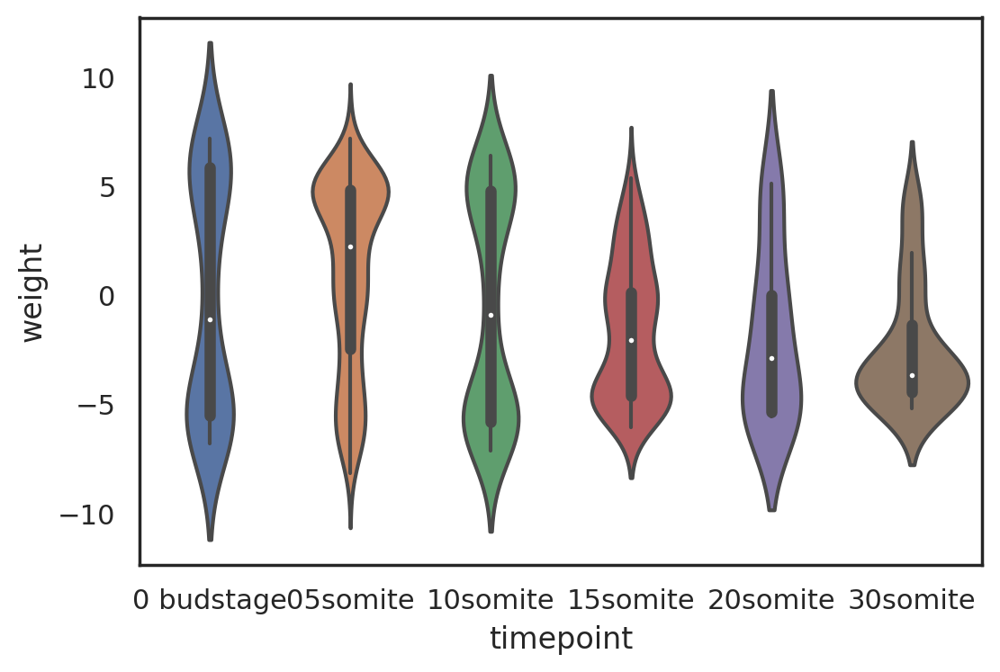

In [950]:
data_df = velod_df[velod_df['lineage']=='log_vel_diff']
data_df.sort_values(by='timepoint',inplace = True)

sns.violinplot(data = data_df, x = 'timepoint',y = 'weight')

In [894]:
data_df["timepoint"]

3876    05somite
3877    05somite
3878    05somite
3879    05somite
3880    05somite
          ...   
4840    30somite
4841    30somite
4842    30somite
4843    30somite
4844    30somite
Name: timepoint, Length: 969, dtype: object

Tidy DF for seaborn -- compare lineage scores

In [803]:
velod_df = pd.melt(velo_df, value_vars = lineage_list + ['velo_diff'], 
                   var_name = 'lineage',value_name = 'weight')



<AxesSubplot:xlabel='lineage', ylabel='weight'>

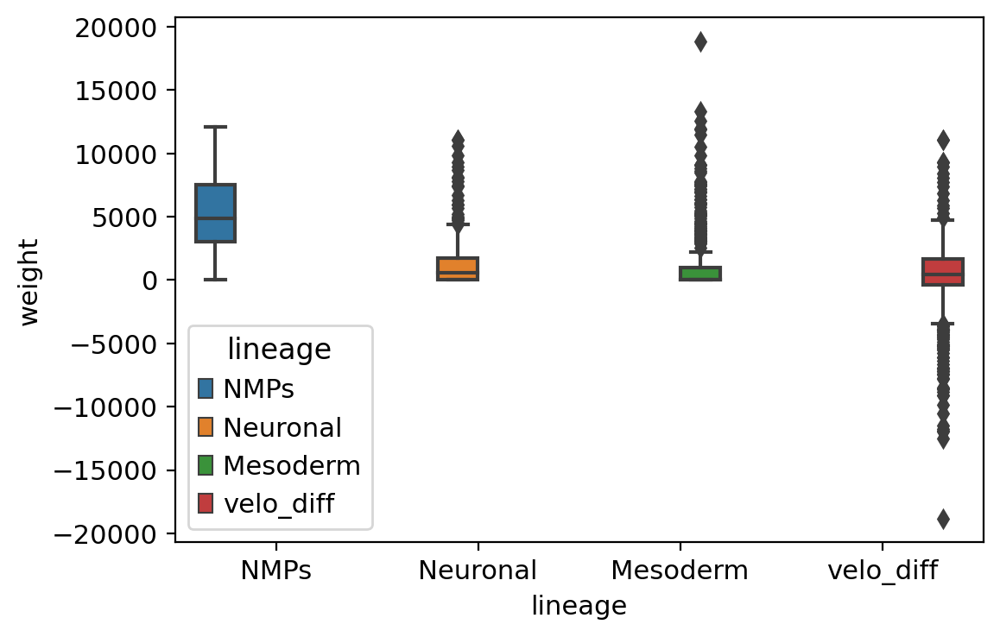

In [804]:
sns.boxplot(data = velod_df, x = 'lineage' , y = 'weight',hue = 'lineage')

#plt.yscale('log')
#plt.ylim(10,20000)

<AxesSubplot:xlabel='velo_diff', ylabel='Count'>

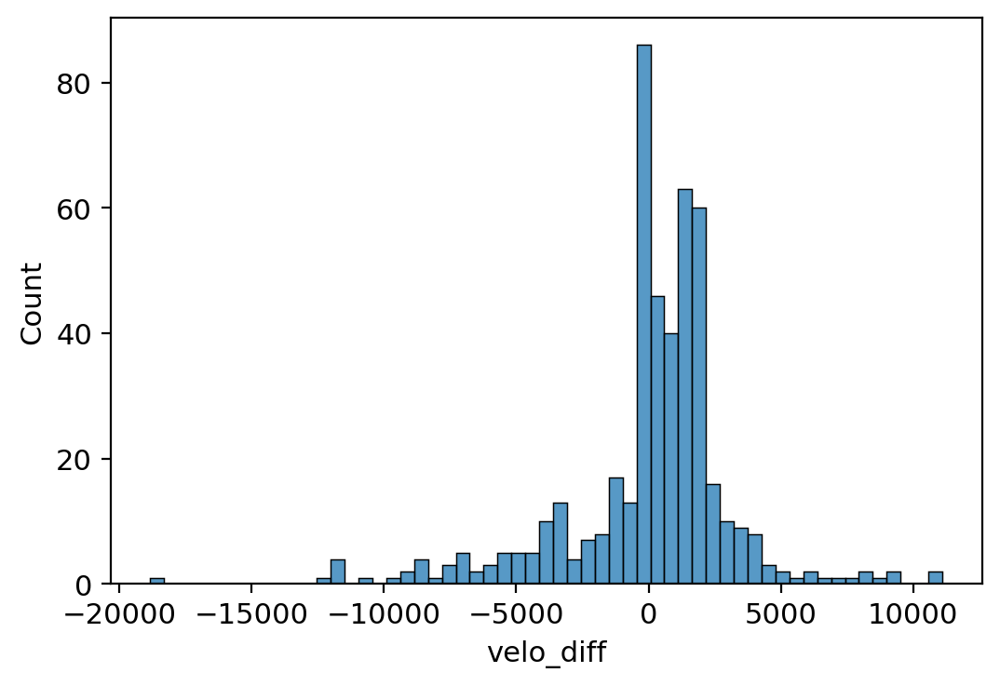

In [805]:
sns.histplot(velo_df['velo_diff'])

Note: I am currently mixing neighbors. 
<br>
* For a single cell, only one lineage should be selected. Ideally, the one with the largest weight 

Save object

In [969]:
for i in range(len(adata_list)):
    timepoint = adata_list[i].obs['timepoint'][0]
    adata_list[i].write('/mnt/ibm_lg/alejandro/danio-atlas/atlas_objects/rna_vel_timpoints/' + timepoint + '_cellrank_Jul2022.h5ad')    